<h1 style="text-align: center;">Object Tracking in EM Images Using CNN–ConvLSTM–U–Net </h1>

This notebook:

1. trains a ConvLSTM-based tracker with a UNet decoder via time-series cross-validation,

2. visualizes fold-wise metrics (Dice/IoU/Pixel Accuracy/ Pixel Erro),

3. evaluates the trained model on several test scenarios using only the first 5 ground-truth masks per sequence.Those early masks with optical flow and exponentially decay their strength so the image channel drives predictions over time. Quantitative test metrics are computed only on frames that actually have GT.

**Filename convention (required for pairing during training):**
images must look like synth_frame_####.png and masks like mask_####.png. Adjust prefixes via img_prefix/mask_prefix if needed.

**Outputs:**

- Per-fold models (encoder, lstm_model, decoder) and predictions

- fold_summary.csv and framewise_metrics.csv under results_dir

- Test predictions under results_dir/test_predictions (change results_dir per scenario to avoid overwriting)

#### Author
- Mobina Azimi, M.Sc
- Email: mobinaazimi999@gmail.com

### Import Required Modules
Import system utilities and the core `LSTM_BASED` class from the JuSPICE library for tracking objects using a combined CNN–ConvLSTM–U–Net approach.

In [2]:
import sys
import numpy as np
import os
from pathlib import Path
from juspice.object_tracking.lstm import LSTM_BASED

sys.path.append(os.path.abspath("C:/git_repository"))


 ### Configure the model for training

Build LSTM_BASED with training directories, frame count, window size, and optimization knobs.
force_full_frame=True keeps ROI = full image for both training and testing (simple and robust).

In [ ]:
model = LSTM_BASED(
    syn_dir= DATA_DIR / "synthetic_results_frames",
    gt_mask_dir= DATA_DIR / "masks_dr_frames",
    results_dir= RESULTS_DIR / "lstm_frames",
    n_frames=1000,
    window_size=5,
    epochs=50,
    batch_size=4,
    force_full_frame=True  # keep ROI consistent
    #force_full_frame=False,  # keep ROI consistent (use full frame for training and testing)
    #manual_roi=(4, 7, 252, 166)
)


### Train with time-series cross-validation

model.run() pairs images+masks, selects ROI, trains the encoder/LSTM/decoder with time-ordered splits, and writes per-fold predictions & models. Runtime is printed at the end.

In [4]:
model.run()

[TRAIN] Paired 1000 image–mask files.
Full-frame mode forced. ROI = image size.

=== Fold 1 ===


I0000 00:00:1756463048.606954 3416576 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22384 MB memory:  -> device: 0, name: NVIDIA A30, pci bus id: 0000:81:00.0, compute capability: 8.0
I0000 00:00:1756463048.608907 3416576 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 22384 MB memory:  -> device: 1, name: NVIDIA A30, pci bus id: 0000:a1:00.0, compute capability: 8.0
I0000 00:00:1756463052.147347 3417104 service.cc:152] XLA service 0x7fa260003d90 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1756463052.147391 3417104 service.cc:160]   StreamExecutor device (0): NVIDIA A30, Compute Capability 8.0
I0000 00:00:1756463052.147397 3417104 service.cc:160]   StreamExecutor device (1): NVIDIA A30, Compute Capability 8.0
2025-08-29 12:24:12.163192: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRA

[Timing] LSTM training...
Epoch 1/50
42/42 - 29s - 684ms/step - loss: 0.0077 - val_loss: 0.0030
Epoch 2/50
42/42 - 3s - 60ms/step - loss: 0.0013 - val_loss: 0.0042
Epoch 3/50
42/42 - 2s - 58ms/step - loss: 9.3374e-04 - val_loss: 0.0050
Epoch 4/50
42/42 - 3s - 60ms/step - loss: 7.7884e-04 - val_loss: 0.0052
Epoch 5/50
42/42 - 3s - 60ms/step - loss: 6.9258e-04 - val_loss: 0.0047
Epoch 6/50
42/42 - 3s - 60ms/step - loss: 6.3625e-04 - val_loss: 0.0039
[Timing] LSTM done in 0m 45.3s.
[Decoder] fit X=(165, 64, 64, 113), y=(165, 256, 256, 1)
Epoch 1/30
21/21 - 22s - 1s/step - loss: 0.1885
Epoch 2/30


/mnt/bcache/work/m.azimi/GIT_repositories/juspice/spice/lib/python3.10/site-packages/keras/src/callbacks/early_stopping.py:153: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: loss
  current = self.get_monitor_value(logs)


21/21 - 1s - 36ms/step - loss: 0.0577
Epoch 3/30
21/21 - 1s - 32ms/step - loss: 0.0418
Epoch 4/30
21/21 - 1s - 31ms/step - loss: 0.0331
Epoch 5/30
21/21 - 1s - 29ms/step - loss: 0.0277
Epoch 6/30
21/21 - 1s - 29ms/step - loss: 0.0239
Epoch 7/30
21/21 - 1s - 30ms/step - loss: 0.0212
Epoch 8/30
21/21 - 1s - 29ms/step - loss: 0.0193
Epoch 9/30
21/21 - 1s - 29ms/step - loss: 0.0179
Epoch 10/30
21/21 - 1s - 29ms/step - loss: 0.0167
Epoch 11/30
21/21 - 1s - 29ms/step - loss: 0.0154
Epoch 12/30
21/21 - 1s - 30ms/step - loss: 0.0143
Epoch 13/30
21/21 - 1s - 29ms/step - loss: 0.0137
Epoch 14/30
21/21 - 1s - 29ms/step - loss: 0.0129
Epoch 15/30
21/21 - 1s - 29ms/step - loss: 0.0123
Epoch 16/30
21/21 - 1s - 29ms/step - loss: 0.0118
Epoch 17/30
21/21 - 1s - 30ms/step - loss: 0.0113
Epoch 18/30
21/21 - 1s - 30ms/step - loss: 0.0111
Epoch 19/30
21/21 - 1s - 29ms/step - loss: 0.0106
Epoch 20/30
21/21 - 1s - 29ms/step - loss: 0.0102
Epoch 21/30
21/21 - 1s - 30ms/step - loss: 0.0098
Epoch 22/30
21/21 -

Average Dice: 0.9791 | IoU: 0.9591 | Pixel Accuracy: 0.9765 | Pixel Error: 0.0235

=== Fold 2 ===
[Timing] LSTM training...
Epoch 1/50
83/83 - 30s - 357ms/step - loss: 0.0061 - val_loss: 0.0051
Epoch 2/50
83/83 - 4s - 50ms/step - loss: 0.0014 - val_loss: 0.0061
Epoch 3/50
83/83 - 4s - 48ms/step - loss: 0.0010 - val_loss: 0.0057
Epoch 4/50
83/83 - 4s - 52ms/step - loss: 8.5998e-04 - val_loss: 0.0041
Epoch 5/50
83/83 - 5s - 63ms/step - loss: 7.4948e-04 - val_loss: 0.0022
Epoch 6/50
83/83 - 4s - 54ms/step - loss: 6.7636e-04 - val_loss: 0.0011
Epoch 7/50
83/83 - 4s - 50ms/step - loss: 6.2518e-04 - val_loss: 6.4171e-04
Epoch 8/50
83/83 - 5s - 59ms/step - loss: 5.8730e-04 - val_loss: 4.9107e-04
Epoch 9/50
83/83 - 4s - 54ms/step - loss: 5.5915e-04 - val_loss: 4.3789e-04
Epoch 10/50
83/83 - 4s - 50ms/step - loss: 5.3552e-04 - val_loss: 4.0958e-04
Epoch 11/50
83/83 - 4s - 53ms/step - loss: 5.1634e-04 - val_loss: 3.9892e-04
Epoch 12/50
83/83 - 5s - 63ms/step - loss: 4.9998e-04 - val_loss: 3.8642

/mnt/bcache/work/m.azimi/GIT_repositories/juspice/spice/lib/python3.10/site-packages/keras/src/callbacks/early_stopping.py:153: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: loss
  current = self.get_monitor_value(logs)


42/42 - 1s - 29ms/step - loss: 0.0317
Epoch 3/30
42/42 - 1s - 28ms/step - loss: 0.0234
Epoch 4/30
42/42 - 1s - 28ms/step - loss: 0.0190
Epoch 5/30
42/42 - 1s - 27ms/step - loss: 0.0163
Epoch 6/30
42/42 - 1s - 27ms/step - loss: 0.0143
Epoch 7/30
42/42 - 1s - 28ms/step - loss: 0.0130
Epoch 8/30
42/42 - 1s - 27ms/step - loss: 0.0118
Epoch 9/30
42/42 - 1s - 28ms/step - loss: 0.0109
Epoch 10/30
42/42 - 1s - 27ms/step - loss: 0.0103
Epoch 11/30
42/42 - 1s - 27ms/step - loss: 0.0097
Epoch 12/30
42/42 - 1s - 27ms/step - loss: 0.0091
Epoch 13/30
42/42 - 1s - 27ms/step - loss: 0.0086
Epoch 14/30
42/42 - 1s - 27ms/step - loss: 0.0081
Epoch 15/30
42/42 - 1s - 28ms/step - loss: 0.0077
Epoch 16/30
42/42 - 1s - 27ms/step - loss: 0.0074
Epoch 17/30
42/42 - 1s - 28ms/step - loss: 0.0072
Epoch 18/30
42/42 - 1s - 29ms/step - loss: 0.0069
Epoch 19/30
42/42 - 1s - 28ms/step - loss: 0.0066
Epoch 20/30
42/42 - 1s - 28ms/step - loss: 0.0063
Epoch 21/30
42/42 - 1s - 27ms/step - loss: 0.0061
Epoch 22/30
42/42 -

Average Dice: 0.9884 | IoU: 0.9772 | Pixel Accuracy: 0.9878 | Pixel Error: 0.0122

=== Fold 3 ===
[Timing] LSTM training...
Epoch 1/50
125/125 - 31s - 249ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 2/50
125/125 - 6s - 50ms/step - loss: 6.5129e-04 - val_loss: 0.0022
Epoch 3/50
125/125 - 6s - 45ms/step - loss: 5.3733e-04 - val_loss: 0.0011
Epoch 4/50
125/125 - 6s - 46ms/step - loss: 4.7437e-04 - val_loss: 3.7178e-04
Epoch 5/50
125/125 - 6s - 48ms/step - loss: 4.2603e-04 - val_loss: 2.9174e-04
Epoch 6/50
125/125 - 6s - 51ms/step - loss: 3.8312e-04 - val_loss: 2.7585e-04
Epoch 7/50
125/125 - 6s - 47ms/step - loss: 3.5346e-04 - val_loss: 2.5615e-04
Epoch 8/50
125/125 - 6s - 46ms/step - loss: 3.3377e-04 - val_loss: 2.4996e-04
Epoch 9/50
125/125 - 6s - 50ms/step - loss: 3.1988e-04 - val_loss: 2.4051e-04
Epoch 10/50
125/125 - 7s - 53ms/step - loss: 3.0772e-04 - val_loss: 2.3280e-04
Epoch 11/50
125/125 - 6s - 46ms/step - loss: 2.9760e-04 - val_loss: 2.2943e-04
Epoch 12/50
125/125 - 6s - 45m

/mnt/bcache/work/m.azimi/GIT_repositories/juspice/spice/lib/python3.10/site-packages/keras/src/callbacks/early_stopping.py:153: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: loss
  current = self.get_monitor_value(logs)


63/63 - 2s - 29ms/step - loss: 0.0244
Epoch 3/30
63/63 - 2s - 27ms/step - loss: 0.0187
Epoch 4/30
63/63 - 2s - 27ms/step - loss: 0.0154
Epoch 5/30
63/63 - 2s - 28ms/step - loss: 0.0134
Epoch 6/30
63/63 - 2s - 29ms/step - loss: 0.0118
Epoch 7/30
63/63 - 2s - 29ms/step - loss: 0.0106
Epoch 8/30
63/63 - 2s - 27ms/step - loss: 0.0096
Epoch 9/30
63/63 - 2s - 27ms/step - loss: 0.0087
Epoch 10/30
63/63 - 2s - 27ms/step - loss: 0.0081
Epoch 11/30
63/63 - 2s - 28ms/step - loss: 0.0076
Epoch 12/30
63/63 - 2s - 28ms/step - loss: 0.0072
Epoch 13/30
63/63 - 2s - 27ms/step - loss: 0.0068
Epoch 14/30
63/63 - 2s - 27ms/step - loss: 0.0065
Epoch 15/30
63/63 - 2s - 27ms/step - loss: 0.0063
Epoch 16/30
63/63 - 2s - 27ms/step - loss: 0.0060
Epoch 17/30
63/63 - 2s - 27ms/step - loss: 0.0057
Epoch 18/30
63/63 - 2s - 27ms/step - loss: 0.0054
Epoch 19/30
63/63 - 2s - 28ms/step - loss: 0.0053
Epoch 20/30
63/63 - 2s - 27ms/step - loss: 0.0051
Epoch 21/30
63/63 - 2s - 27ms/step - loss: 0.0049
Epoch 22/30
63/63 -

Average Dice: 0.9886 | IoU: 0.9776 | Pixel Accuracy: 0.9899 | Pixel Error: 0.0101

=== Fold 4 ===
[Timing] LSTM training...
Epoch 1/50
166/166 - 35s - 214ms/step - loss: 0.0023 - val_loss: 0.0024
Epoch 2/50
166/166 - 7s - 45ms/step - loss: 5.7939e-04 - val_loss: 0.0015
Epoch 3/50
166/166 - 9s - 51ms/step - loss: 4.7719e-04 - val_loss: 5.6937e-04
Epoch 4/50
166/166 - 8s - 48ms/step - loss: 4.2268e-04 - val_loss: 3.2816e-04
Epoch 5/50
166/166 - 7s - 44ms/step - loss: 3.9133e-04 - val_loss: 2.9426e-04
Epoch 6/50
166/166 - 7s - 45ms/step - loss: 3.6929e-04 - val_loss: 2.8054e-04
Epoch 7/50
166/166 - 9s - 53ms/step - loss: 3.5278e-04 - val_loss: 2.6837e-04
Epoch 8/50
166/166 - 8s - 48ms/step - loss: 3.3675e-04 - val_loss: 2.5863e-04
Epoch 9/50
166/166 - 7s - 45ms/step - loss: 3.2458e-04 - val_loss: 2.5265e-04
Epoch 10/50
166/166 - 8s - 48ms/step - loss: 3.1407e-04 - val_loss: 2.4472e-04
Epoch 11/50
166/166 - 8s - 48ms/step - loss: 3.0424e-04 - val_loss: 2.3629e-04
Epoch 12/50
166/166 - 7s -

/mnt/bcache/work/m.azimi/GIT_repositories/juspice/spice/lib/python3.10/site-packages/keras/src/callbacks/early_stopping.py:153: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: loss
  current = self.get_monitor_value(logs)


83/83 - 2s - 28ms/step - loss: 0.0217
Epoch 3/30
83/83 - 2s - 28ms/step - loss: 0.0161
Epoch 4/30
83/83 - 2s - 28ms/step - loss: 0.0133
Epoch 5/30
83/83 - 2s - 26ms/step - loss: 0.0115
Epoch 6/30
83/83 - 2s - 26ms/step - loss: 0.0100
Epoch 7/30
83/83 - 2s - 27ms/step - loss: 0.0090
Epoch 8/30
83/83 - 2s - 26ms/step - loss: 0.0084
Epoch 9/30
83/83 - 2s - 26ms/step - loss: 0.0077
Epoch 10/30
83/83 - 2s - 27ms/step - loss: 0.0072
Epoch 11/30
83/83 - 2s - 27ms/step - loss: 0.0068
Epoch 12/30
83/83 - 2s - 29ms/step - loss: 0.0066
Epoch 13/30
83/83 - 2s - 27ms/step - loss: 0.0060
Epoch 14/30
83/83 - 2s - 27ms/step - loss: 0.0057
Epoch 15/30
83/83 - 2s - 27ms/step - loss: 0.0055
Epoch 16/30
83/83 - 2s - 28ms/step - loss: 0.0053
Epoch 17/30
83/83 - 2s - 27ms/step - loss: 0.0050
Epoch 18/30
83/83 - 2s - 27ms/step - loss: 0.0048
Epoch 19/30
83/83 - 2s - 27ms/step - loss: 0.0048
Epoch 20/30
83/83 - 3s - 31ms/step - loss: 0.0046
Epoch 21/30
83/83 - 2s - 27ms/step - loss: 0.0045
Epoch 22/30
83/83 -

Average Dice: 0.9960 | IoU: 0.9921 | Pixel Accuracy: 0.9968 | Pixel Error: 0.0032

=== Fold 5 ===
[Timing] LSTM training...
Epoch 1/50
208/208 - 35s - 170ms/step - loss: 0.0026 - val_loss: 0.0041
Epoch 2/50
208/208 - 9s - 43ms/step - loss: 6.5117e-04 - val_loss: 0.0015
Epoch 3/50
208/208 - 9s - 43ms/step - loss: 5.1971e-04 - val_loss: 4.6542e-04
Epoch 4/50
208/208 - 10s - 46ms/step - loss: 4.6342e-04 - val_loss: 3.6084e-04
Epoch 5/50
208/208 - 9s - 44ms/step - loss: 4.2965e-04 - val_loss: 3.3180e-04
Epoch 6/50
208/208 - 9s - 42ms/step - loss: 4.0231e-04 - val_loss: 3.1203e-04
Epoch 7/50
208/208 - 10s - 50ms/step - loss: 3.8073e-04 - val_loss: 3.0957e-04
Epoch 8/50
208/208 - 10s - 46ms/step - loss: 3.6496e-04 - val_loss: 3.0767e-04
Epoch 9/50
208/208 - 9s - 43ms/step - loss: 3.5162e-04 - val_loss: 3.0714e-04
Epoch 10/50
208/208 - 12s - 59ms/step - loss: 3.4057e-04 - val_loss: 3.0761e-04
Epoch 11/50
208/208 - 9s - 44ms/step - loss: 3.3063e-04 - val_loss: 3.1158e-04
Epoch 12/50
208/208 - 

/mnt/bcache/work/m.azimi/GIT_repositories/juspice/spice/lib/python3.10/site-packages/keras/src/callbacks/early_stopping.py:153: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: loss
  current = self.get_monitor_value(logs)


104/104 - 3s - 28ms/step - loss: 0.0202
Epoch 3/30
104/104 - 3s - 27ms/step - loss: 0.0150
Epoch 4/30
104/104 - 3s - 29ms/step - loss: 0.0124
Epoch 5/30
104/104 - 3s - 26ms/step - loss: 0.0100
Epoch 6/30
104/104 - 3s - 27ms/step - loss: 0.0088
Epoch 7/30
104/104 - 3s - 26ms/step - loss: 0.0080
Epoch 8/30
104/104 - 3s - 27ms/step - loss: 0.0073
Epoch 9/30
104/104 - 3s - 27ms/step - loss: 0.0068
Epoch 10/30
104/104 - 3s - 27ms/step - loss: 0.0062
Epoch 11/30
104/104 - 3s - 27ms/step - loss: 0.0060
Epoch 12/30
104/104 - 3s - 28ms/step - loss: 0.0056
Epoch 13/30
104/104 - 3s - 25ms/step - loss: 0.0052
Epoch 14/30
104/104 - 3s - 25ms/step - loss: 0.0052
Epoch 15/30
104/104 - 3s - 26ms/step - loss: 0.0049
Epoch 16/30
104/104 - 3s - 27ms/step - loss: 0.0048
Epoch 17/30
104/104 - 3s - 27ms/step - loss: 0.0045
Epoch 18/30
104/104 - 3s - 27ms/step - loss: 0.0044
Epoch 19/30
104/104 - 3s - 28ms/step - loss: 0.0042
Epoch 20/30
104/104 - 3s - 27ms/step - loss: 0.0042
Epoch 21/30
104/104 - 3s - 27ms

Average Dice: 0.9960 | IoU: 0.9921 | Pixel Accuracy: 0.9964 | Pixel Error: 0.0036

====== FINAL (All Folds) ======
Mean Dice: 0.9896 | Mean IoU: 0.9796 | Mean PixelAccuracy: 0.9895
[Timing] Train+Val total: 2165.72 s


### Fold-wise bar chart

Load fold_summary.csv from results_dir and plot mean Dice/IoU/PixelAccuracy per fold.

   Fold      Dice       IoU  PixelAccuracy  PixelError
0     1  0.979105  0.959067       0.976472    0.023528
1     2  0.988397  0.977177       0.987819    0.012181
2     3  0.988639  0.977558       0.989883    0.010117
3     4  0.996043  0.992118       0.996791    0.003209
4     5  0.996030  0.992091       0.996429    0.003571


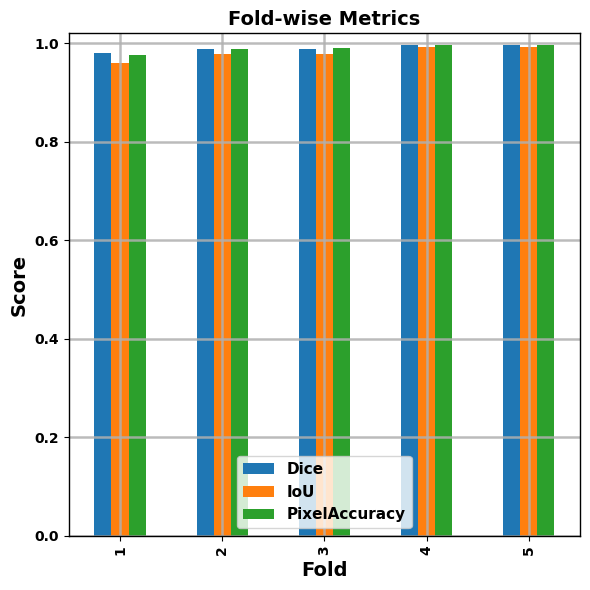

In [23]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

summary_csv = Path(model.results_dir) / "fold_summary.csv"  # use the model’s results dir

if summary_csv.exists():
    df = pd.read_csv(summary_csv)
    print(df)
    ax = df[["Fold","Dice","IoU","PixelAccuracy"]].set_index("Fold").plot(kind="bar", title="Fold-wise Metrics")
    ax.set_ylabel("Score"); ax.set_ylim(0, 1.02); ax.grid(True, axis="y"); ax.figure.set_size_inches(6, 6)
    plt.tight_layout(); plt.show()
else:
    print(f"Not found: {summary_csv.resolve()}")



### Scenario A: Many particles, dramatic motion/changes
`hint_scale_test=0.12`, `hint_min_scale=0.03`, `hint_decay_tau=60`: small initial hint, never zero, slow decay.

use_first_n_masks=5: only the first five GT masks are used to seed hints (no leakage).
The call returns ret with raw predictions (decoded), predicted indices (y_idx), and the actual hint frames used.

[DEBUG] test_edges stats per first frames: [(0.0, 0.10378875583410263, 0.30000001192092896), (0.0, 0.10552367568016052, 0.30000001192092896), (0.0, 0.1071121096611023, 0.30000001192092896), (0.0, 0.10879211127758026, 0.30000001192092896), (0.0, 0.11044464260339737, 0.30000001192092896)]
[DEBUG] decoded min/mean/max: 1.697929421255733e-26 0.48315051198005676 1.0
synth_frame_005.png: Dice=0.9711, IoU=0.9439, PixelError=0.0212
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_005.png


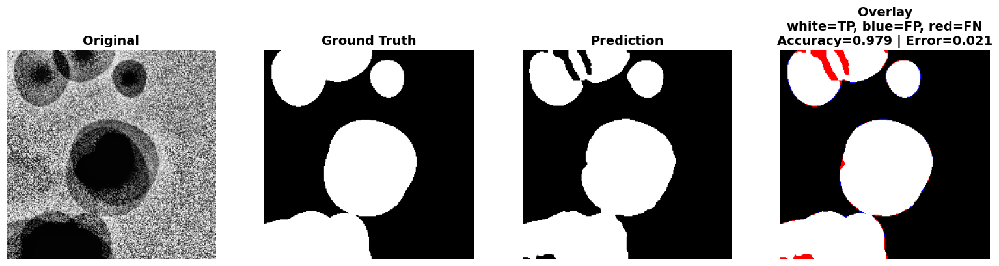

synth_frame_102.png: Dice=0.8990, IoU=0.8165, PixelError=0.1068
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_102.png


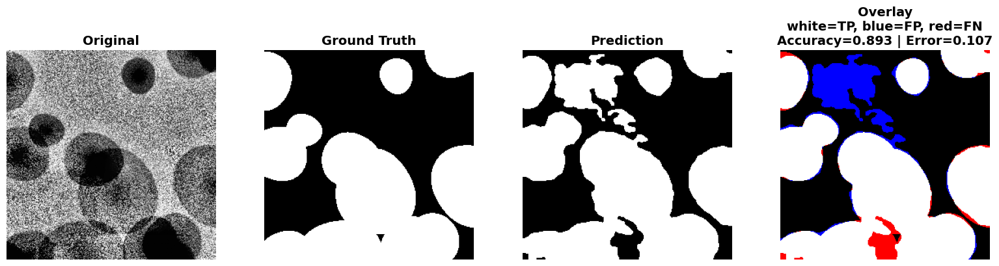

synth_frame_199.png: Dice=0.9319, IoU=0.8725, PixelError=0.0475
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_199.png


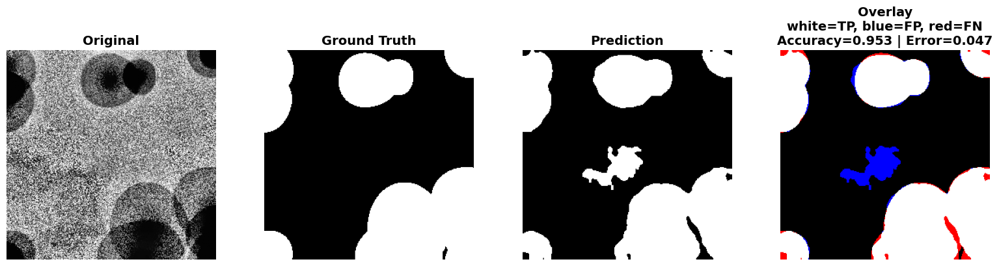

Average Dice: 0.9251 | IoU: 0.8617 | Pixel Accuracy: 0.9276 | Pixel Error: 0.0724


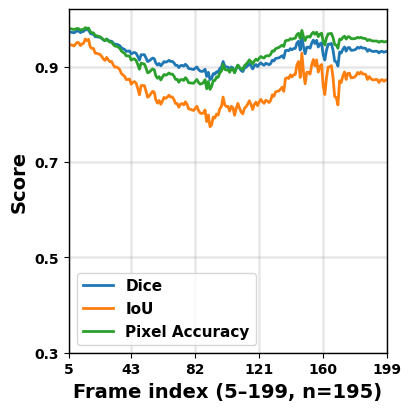

[SANITY] predicted frames: 195
[SANITY] first/last indices: 5 … 199


In [ ]:
# use the 5 masks lightly, then fade them out
model.hint_scale_test = 0.12      # small but nonzero → encoder can “see” the hint
model.hint_min_scale  = 0.03      # floor so the hint never fully vanishes
model.hint_decay_tau  = 60        # slower decay → more stable early frames

ret = model.predict_test_dataset(
    test_img_dir= DATA / "synthetic_test",
    test_gt_dir= DATA / "masks_test",
    use_first_n_masks=5,           # only first 5 masks are used (no leakage)
    edge_scale=0.30,                # initial hint strength before decay
    evaluate_test=True,
    gt_is_clean_binary=True,
    return_arrays=True
)

assert ret is not None
YIDX = ret["y_idx"].astype(int)
print(f"[SANITY] predicted frames: {len(YIDX)}")
print(f"[SANITY] first/last indices: {YIDX[0]} … {YIDX[-1]}")

### Compute per-frame signed surface distances, plus ASSD and HD95.
Evaluate only on frames that have GT, plot a signed-distance histogram (under/over-seg), and show ASSD/HD95 over time. Summary stats are printed.

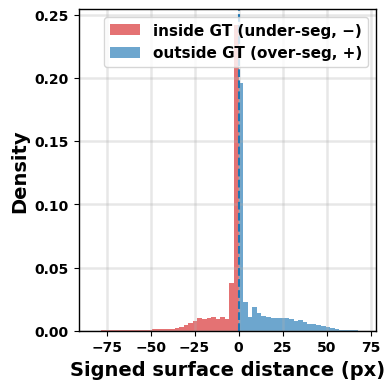

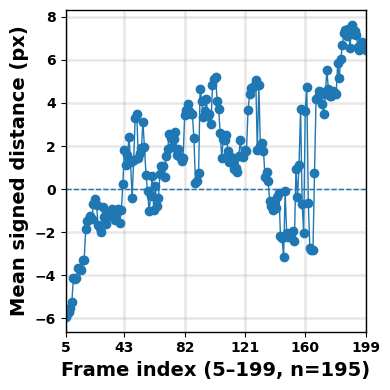

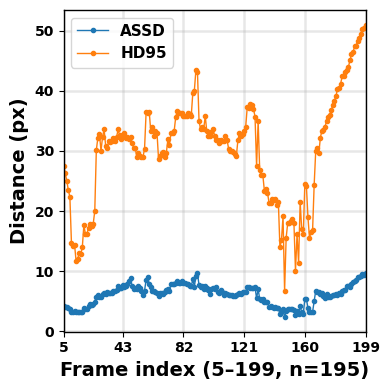

[SUMMARY over 195 frames] ASSD median=6.390px | HD95 median=31.852px | mean signed (overall)=1.432px


In [ ]:
# ==== Surface-distance evaluation (histogram + time series) ====
import re, numpy as np, cv2, matplotlib.pyplot as plt
from pathlib import Path
from skimage.io import imread
from scipy.ndimage import distance_transform_edt as edt

def _num_key(p: Path):
    m = re.findall(r'\d+', p.stem)
    return int(m[-1]) if m else None

def signed_dt(mask_bin: np.ndarray) -> np.ndarray:
    """
    Signed distance transform of a binary mask (1=FG, GT in our use).
    Using sdt = edt(~m) - edt(m):
      negative -> inside GT (under-seg)
      positive -> outside GT (over-seg)
    """
    m = mask_bin.astype(bool)
    d_out = edt(~m)
    d_in  = edt(m)
    return d_out - d_in

def boundary(mask_bin: np.ndarray) -> np.ndarray:
    k = np.ones((3,3), np.uint8)
    er = cv2.erode(mask_bin.astype(np.uint8), k, iterations=1)
    return (mask_bin.astype(np.uint8) ^ er).astype(np.uint8)

def hausdorff95(sym_dists_abs: np.ndarray) -> float:
    return np.nan if sym_dists_abs.size == 0 else float(np.percentile(sym_dists_abs, 95))

def assd_from_sym(sym_dists_abs: np.ndarray) -> float:
    return np.nan if sym_dists_abs.size == 0 else float(np.mean(sym_dists_abs))

# --- gather arrays from predict_test_dataset(..., return_arrays=True) ---
assert ret is not None, "ret is None — call predict_test_dataset(..., return_arrays=True) first."
D    = ret["decoded"]                 # (T_pred,H,W) raw probabilities
YIDX = ret["y_idx"].astype(int)       # global frame indices
ROIh, ROIw = D.shape[1:]

# --- map GT files and align with predicted frames ---
test_gt_dir = Path(DATA / "mask_test")
gt_map = { _num_key(f): f for f in test_gt_dir.glob("*") if _num_key(f) is not None }

sel = [i for i,k in enumerate(YIDX) if k in gt_map]
if not sel:
    raise RuntimeError("No overlapping GT for predicted frames; check filenames/numbering.")
#sel = sel[:200]

all_signed = []
ts_mean_signed, ts_assd, ts_hd95, ts_idx = [], [], [], []

for i in sel:
    k      = int(YIDX[i])
    pred_p = D[i]
    pred_b = model.clean_edges(pred_p).astype(np.uint8)

    gt_im = imread(str(gt_map[k]))
    if gt_im.ndim == 3: gt_im = gt_im[...,0]
    gt_crop = model.crop_to_roi(gt_im)
    gt_bin  = (gt_crop > 127).astype(np.uint8)

    if pred_b.shape != gt_bin.shape:
        pred_b = cv2.resize(pred_b, (gt_bin.shape[1], gt_bin.shape[0]), interpolation=cv2.INTER_NEAREST)

    sdt_gt = signed_dt(gt_bin)
    Bp = boundary(pred_b)
    signed_pred_to_gt = sdt_gt[Bp > 0]               # < 0: inside GT (under-seg), > 0: outside GT (over-seg)

    sdt_pred = signed_dt(pred_b)
    Bg = boundary(gt_bin)
    abs_gt_to_pred = np.abs(sdt_pred[Bg > 0])
    abs_pred_to_gt = np.abs(signed_pred_to_gt)
    sym_abs = np.concatenate([abs_gt_to_pred, abs_pred_to_gt], axis=0) if (abs_gt_to_pred.size or abs_pred_to_gt.size) else np.array([])

    if signed_pred_to_gt.size:
        all_signed.append(signed_pred_to_gt)
        ts_mean_signed.append(float(np.mean(signed_pred_to_gt)))
    else:
        ts_mean_signed.append(np.nan)

    ts_assd.append(assd_from_sym(sym_abs))
    ts_hd95.append(hausdorff95(sym_abs))
    ts_idx.append(k)

if not all_signed:
    raise RuntimeError("No boundary pixels collected. Check masks or thresholds.")
all_signed = np.concatenate(all_signed, axis=0)

# 1) Signed distance histogram
plt.figure(figsize=(4.0,4.0))
neg = all_signed[all_signed < 0]     # inside GT  -> under-seg
pos = all_signed[all_signed >= 0]    # outside GT -> over-seg
bins = np.linspace(min(-5, np.min(all_signed)), max(5, np.max(all_signed)), 60)


FP_COLOR = '#1f77b4'   # blue  (outside GT → FP / over-seg / +)
FN_COLOR = '#d62728'   # red   (inside GT  → FN / under-seg / −)
plt.hist(neg, bins=bins, alpha=0.65, label="inside GT (under-seg, −)", density=True, color=FN_COLOR)
plt.hist(pos, bins=bins, alpha=0.65, label="outside GT (over-seg, +)", density=True, color=FP_COLOR)
plt.axvline(0, linestyle="--")
plt.xlabel("Signed surface distance (px)")
plt.ylabel("Density")
#plt.title("Prediction–GT surface distance (signed)\n(− inside / + outside)")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# 2) Time series
#ts_idx         = np.array(ts_idx)
ts_idx = np.array(ts_idx, dtype=int)
xmin, xmax = int(ts_idx.min()), int(ts_idx.max())
xticks = np.linspace(xmin, xmax, 6, dtype=int)
ts_mean_signed = np.array(ts_mean_signed)
ts_assd        = np.array(ts_assd)
ts_hd95        = np.array(ts_hd95)

plt.figure(figsize=(4.0,4.0))
plt.plot(ts_idx, ts_mean_signed, marker='o', linewidth=1)
plt.axhline(0, linestyle="--", linewidth=1)
plt.xlim(xmin, xmax); plt.xticks(xticks)
plt.xlabel(f"Frame index ({xmin}–{xmax}, n={len(ts_idx)})")
plt.ylabel("Mean signed distance (px)")
plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

plt.figure(figsize=(4.0,4.0))
plt.plot(ts_idx, ts_assd, marker='.', linewidth=1, label="ASSD")
plt.plot(ts_idx, ts_hd95, marker='.', linewidth=1, label="HD95")
plt.xlim(xmin, xmax); plt.xticks(xticks)
plt.xlabel(f"Frame index ({xmin}–{xmax}, n={len(ts_idx)})")
plt.ylabel("Distance (px)")
plt.legend(); plt.grid(alpha=0.3); plt.tight_layout(); plt.show()


print(f"[SUMMARY over {len(sel)} frames] "
      f"ASSD median={np.nanmedian(ts_assd):.3f}px | "
      f"HD95 median={np.nanmedian(ts_hd95):.3f}px | "
      f"mean signed (overall)={np.nanmean(ts_mean_signed):.3f}px")

### Scenario B: EM-like single cluster, smooth growth/shrink 


[DEBUG] test_edges stats per first frames: [(0.0, 0.12099151313304901, 0.30000001192092896), (0.0, 0.12133483588695526, 0.30000001192092896), (0.0, 0.12173308432102203, 0.30000001192092896), (0.0, 0.12214050441980362, 0.30000001192092896), (0.0, 0.12247467041015625, 0.30000001192092896)]
[DEBUG] decoded min/mean/max: 1.7419324523275103e-25 0.39013049006462097 1.0
synth_frame_005.png: Dice=0.9818, IoU=0.9642, PixelError=0.0147
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_005.png


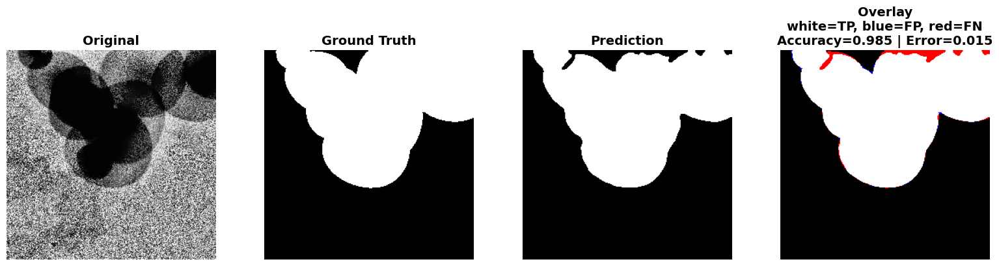

synth_frame_102.png: Dice=0.9773, IoU=0.9556, PixelError=0.0179
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_102.png


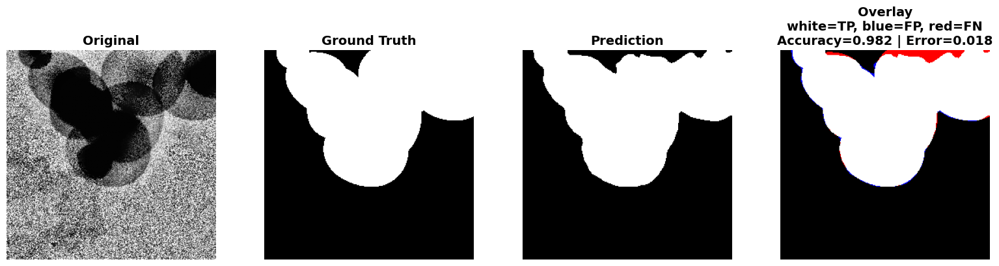

synth_frame_199.png: Dice=0.9744, IoU=0.9501, PixelError=0.0202
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_199.png


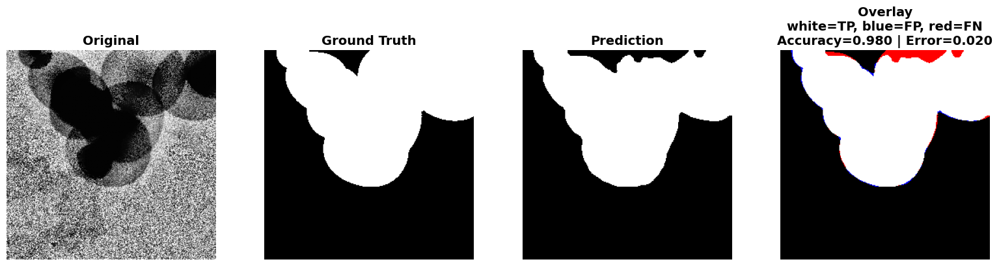

Average Dice: 0.9773 | IoU: 0.9556 | Pixel Accuracy: 0.9825 | Pixel Error: 0.0175


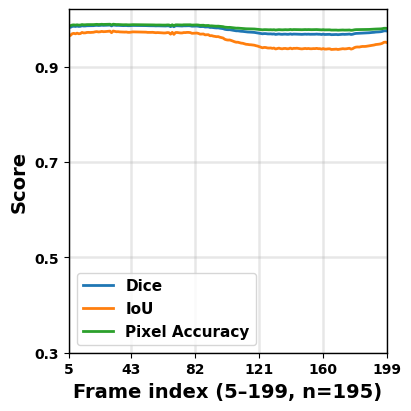

[SANITY] predicted frames: 195
[SANITY] first/last indices: 5 … 199


In [ ]:
# use the 5 masks lightly, then fade them out
model.hint_scale_test = 0.12      # small but nonzero → encoder can “see” the hint
model.hint_min_scale  = 0.03      # floor so the hint never fully vanishes
model.hint_decay_tau  = 60        # slower decay → more stable early frames

ret = model.predict_test_dataset(
    test_img_dir= DATA / "synthetic_test",
    test_gt_dir= DATA / "mask_test",
    use_first_n_masks=5,           # only first 5 masks are used (no leakage)
    edge_scale=0.30,                # initial hint strength before decay
    evaluate_test=True,
    gt_is_clean_binary=True,
    return_arrays=True
)

assert ret is not None
YIDX = ret["y_idx"].astype(int)
print(f"[SANITY] predicted frames: {len(YIDX)}")
print(f"[SANITY] first/last indices: {YIDX[0]} … {YIDX[-1]}")

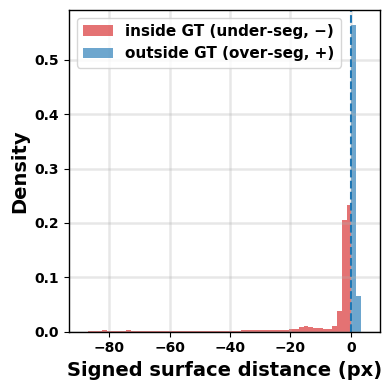

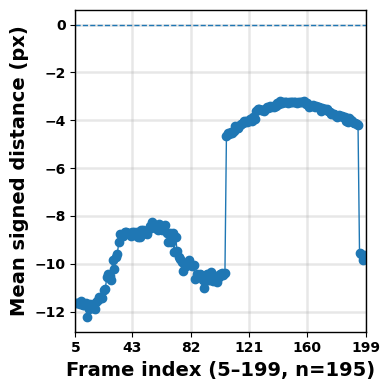

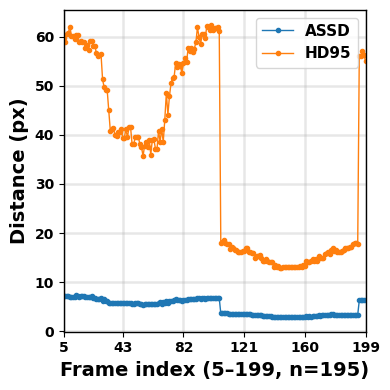

[SUMMARY over 195 frames] ASSD median=5.610px | HD95 median=38.092px | mean signed (overall)=-7.092px


In [ ]:
# ==== Surface-distance evaluation (histogram + time series) ====
import re, numpy as np, cv2, matplotlib.pyplot as plt
from pathlib import Path
from skimage.io import imread
from scipy.ndimage import distance_transform_edt as edt

def _num_key(p: Path):
    m = re.findall(r'\d+', p.stem)
    return int(m[-1]) if m else None

def signed_dt(mask_bin: np.ndarray) -> np.ndarray:
    """
    Signed distance transform of a binary mask (1=FG, GT in our use).
    Using sdt = edt(~m) - edt(m):
      negative -> inside GT (under-seg)
      positive -> outside GT (over-seg)
    """
    m = mask_bin.astype(bool)
    d_out = edt(~m)
    d_in  = edt(m)
    return d_out - d_in

def boundary(mask_bin: np.ndarray) -> np.ndarray:
    k = np.ones((3,3), np.uint8)
    er = cv2.erode(mask_bin.astype(np.uint8), k, iterations=1)
    return (mask_bin.astype(np.uint8) ^ er).astype(np.uint8)

def hausdorff95(sym_dists_abs: np.ndarray) -> float:
    return np.nan if sym_dists_abs.size == 0 else float(np.percentile(sym_dists_abs, 95))

def assd_from_sym(sym_dists_abs: np.ndarray) -> float:
    return np.nan if sym_dists_abs.size == 0 else float(np.mean(sym_dists_abs))

# --- gather arrays from predict_test_dataset(..., return_arrays=True) ---
assert ret is not None, "ret is None — call predict_test_dataset(..., return_arrays=True) first."
D    = ret["decoded"]                 # (T_pred,H,W) raw probabilities
YIDX = ret["y_idx"].astype(int)       # global frame indices
ROIh, ROIw = D.shape[1:]

# --- map GT files and align with predicted frames ---
test_gt_dir = Path(DATA / "mask_test")
gt_map = { _num_key(f): f for f in test_gt_dir.glob("*") if _num_key(f) is not None }

sel = [i for i,k in enumerate(YIDX) if k in gt_map]
if not sel:
    raise RuntimeError("No overlapping GT for predicted frames; check filenames/numbering.")
#sel = sel[:200]

all_signed = []
ts_mean_signed, ts_assd, ts_hd95, ts_idx = [], [], [], []

for i in sel:
    k      = int(YIDX[i])
    pred_p = D[i]
    pred_b = model.clean_edges(pred_p).astype(np.uint8)

    gt_im = imread(str(gt_map[k]))
    if gt_im.ndim == 3: gt_im = gt_im[...,0]
    gt_crop = model.crop_to_roi(gt_im)
    gt_bin  = (gt_crop > 127).astype(np.uint8)

    if pred_b.shape != gt_bin.shape:
        pred_b = cv2.resize(pred_b, (gt_bin.shape[1], gt_bin.shape[0]), interpolation=cv2.INTER_NEAREST)

    sdt_gt = signed_dt(gt_bin)
    Bp = boundary(pred_b)
    signed_pred_to_gt = sdt_gt[Bp > 0]               # < 0: inside GT (under-seg), > 0: outside GT (over-seg)

    sdt_pred = signed_dt(pred_b)
    Bg = boundary(gt_bin)
    abs_gt_to_pred = np.abs(sdt_pred[Bg > 0])
    abs_pred_to_gt = np.abs(signed_pred_to_gt)
    sym_abs = np.concatenate([abs_gt_to_pred, abs_pred_to_gt], axis=0) if (abs_gt_to_pred.size or abs_pred_to_gt.size) else np.array([])

    if signed_pred_to_gt.size:
        all_signed.append(signed_pred_to_gt)
        ts_mean_signed.append(float(np.mean(signed_pred_to_gt)))
    else:
        ts_mean_signed.append(np.nan)

    ts_assd.append(assd_from_sym(sym_abs))
    ts_hd95.append(hausdorff95(sym_abs))
    ts_idx.append(k)

if not all_signed:
    raise RuntimeError("No boundary pixels collected. Check masks or thresholds.")
all_signed = np.concatenate(all_signed, axis=0)

# 1) Signed distance histogram
plt.figure(figsize=(4.0,4.0))
neg = all_signed[all_signed < 0]     # inside GT  -> under-seg
pos = all_signed[all_signed >= 0]    # outside GT -> over-seg
bins = np.linspace(min(-5, np.min(all_signed)), max(5, np.max(all_signed)), 60)


FP_COLOR = '#1f77b4'   # blue  (outside GT → FP / over-seg / +)
FN_COLOR = '#d62728'   # red   (inside GT  → FN / under-seg / −)
plt.hist(neg, bins=bins, alpha=0.65, label="inside GT (under-seg, −)", density=True, color=FN_COLOR)
plt.hist(pos, bins=bins, alpha=0.65, label="outside GT (over-seg, +)", density=True, color=FP_COLOR)
plt.axvline(0, linestyle="--")
plt.xlabel("Signed surface distance (px)")
plt.ylabel("Density")
#plt.title("Prediction–GT surface distance (signed)\n(− inside / + outside)")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# 2) Time series
#ts_idx         = np.array(ts_idx)
ts_idx = np.array(ts_idx, dtype=int)
xmin, xmax = int(ts_idx.min()), int(ts_idx.max())
xticks = np.linspace(xmin, xmax, 6, dtype=int)
ts_mean_signed = np.array(ts_mean_signed)
ts_assd        = np.array(ts_assd)
ts_hd95        = np.array(ts_hd95)

plt.figure(figsize=(4.0,4.0))
plt.plot(ts_idx, ts_mean_signed, marker='o', linewidth=1)
plt.axhline(0, linestyle="--", linewidth=1)
plt.xlim(xmin, xmax); plt.xticks(xticks)
plt.xlabel(f"Frame index ({xmin}–{xmax}, n={len(ts_idx)})")
plt.ylabel("Mean signed distance (px)")
plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

plt.figure(figsize=(4.0,4.0))
plt.plot(ts_idx, ts_assd, marker='.', linewidth=1, label="ASSD")
plt.plot(ts_idx, ts_hd95, marker='.', linewidth=1, label="HD95")
plt.xlim(xmin, xmax); plt.xticks(xticks)
plt.xlabel(f"Frame index ({xmin}–{xmax}, n={len(ts_idx)})")
plt.ylabel("Distance (px)")
plt.legend(); plt.grid(alpha=0.3); plt.tight_layout(); plt.show()


print(f"[SUMMARY over {len(sel)} frames] "
      f"ASSD median={np.nanmedian(ts_assd):.3f}px | "
      f"HD95 median={np.nanmedian(ts_hd95):.3f}px | "
      f"mean signed (overall)={np.nanmean(ts_mean_signed):.3f}px")

### Scenario C: Two separated clusters in different parts of the image (smooth change)


[DEBUG] test_edges stats per first frames: [(0.0, 0.12938231229782104, 0.30000001192092896), (0.0, 0.13007812201976776, 0.30000001192092896), (0.0, 0.1306503266096115, 0.30000001192092896), (0.0, 0.13129577040672302, 0.30000001192092896), (0.0, 0.1319229006767273, 0.30000001192092896)]
[DEBUG] decoded min/mean/max: 2.150672471980176e-24 0.42348945140838623 1.0
synth_frame_005.png: Dice=0.9799, IoU=0.9607, PixelError=0.0175
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_005.png


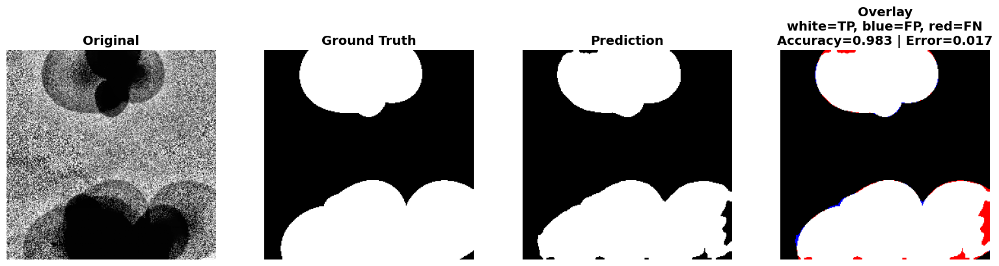

synth_frame_102.png: Dice=0.9736, IoU=0.9486, PixelError=0.0223
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_102.png


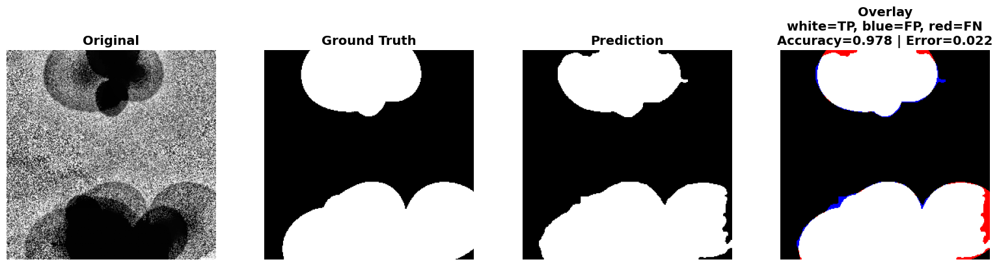

synth_frame_199.png: Dice=0.9672, IoU=0.9365, PixelError=0.0277
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_199.png


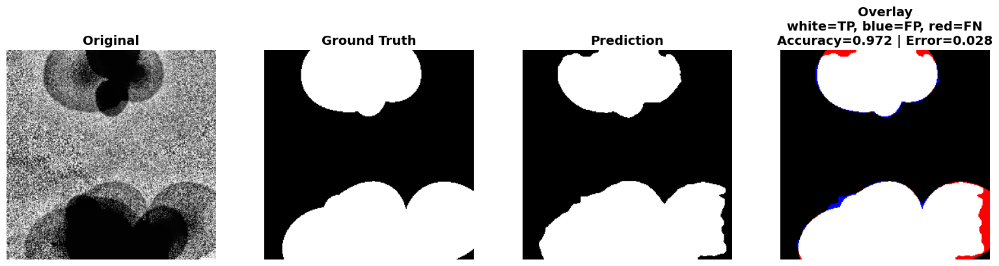

Average Dice: 0.9744 | IoU: 0.9502 | Pixel Accuracy: 0.9785 | Pixel Error: 0.0215


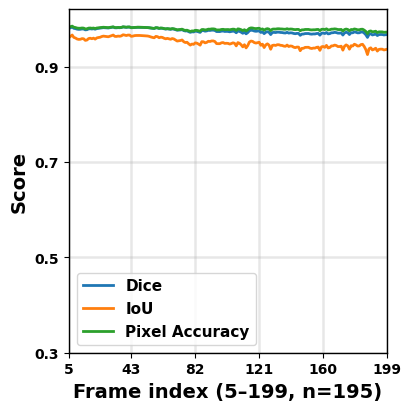

[SANITY] predicted frames: 195
[SANITY] first/last indices: 5 … 199


In [ ]:
# use the 5 masks lightly, then fade them out
model.hint_scale_test = 0.12      # small but nonzero → encoder can “see” the hint
model.hint_min_scale  = 0.03      # floor so the hint never fully vanishes
model.hint_decay_tau  = 60        # slower decay → more stable early frames

ret = model.predict_test_dataset(
    test_img_dir= DATA / "synthetic_test",
    test_gt_dir= DATA / "mask_test",
    use_first_n_masks=5,           # only first 5 masks are used (no leakage)
    edge_scale=0.30,                # initial hint strength before decay
    evaluate_test=True,
    gt_is_clean_binary=True,
    return_arrays=True
)

assert ret is not None
YIDX = ret["y_idx"].astype(int)
print(f"[SANITY] predicted frames: {len(YIDX)}")
print(f"[SANITY] first/last indices: {YIDX[0]} … {YIDX[-1]}")

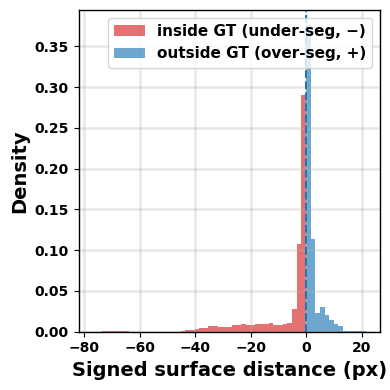

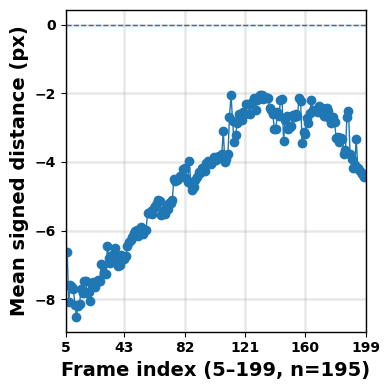

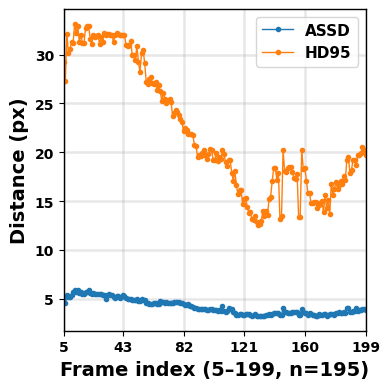

[SUMMARY over 195 frames] ASSD median=3.948px | HD95 median=19.789px | mean signed (overall)=-4.450px


In [ ]:
# ==== Surface-distance evaluation (histogram + time series) ====
import re, numpy as np, cv2, matplotlib.pyplot as plt
from pathlib import Path
from skimage.io import imread
from scipy.ndimage import distance_transform_edt as edt

def _num_key(p: Path):
    m = re.findall(r'\d+', p.stem)
    return int(m[-1]) if m else None

def signed_dt(mask_bin: np.ndarray) -> np.ndarray:
    """
    Signed distance transform of a binary mask (1=FG, GT in our use).
    Using sdt = edt(~m) - edt(m):
      negative -> inside GT (under-seg)
      positive -> outside GT (over-seg)
    """
    m = mask_bin.astype(bool)
    d_out = edt(~m)
    d_in  = edt(m)
    return d_out - d_in

def boundary(mask_bin: np.ndarray) -> np.ndarray:
    k = np.ones((3,3), np.uint8)
    er = cv2.erode(mask_bin.astype(np.uint8), k, iterations=1)
    return (mask_bin.astype(np.uint8) ^ er).astype(np.uint8)

def hausdorff95(sym_dists_abs: np.ndarray) -> float:
    return np.nan if sym_dists_abs.size == 0 else float(np.percentile(sym_dists_abs, 95))

def assd_from_sym(sym_dists_abs: np.ndarray) -> float:
    return np.nan if sym_dists_abs.size == 0 else float(np.mean(sym_dists_abs))

# --- gather arrays from predict_test_dataset(..., return_arrays=True) ---
assert ret is not None, "ret is None — call predict_test_dataset(..., return_arrays=True) first."
D    = ret["decoded"]                 # (T_pred,H,W) raw probabilities
YIDX = ret["y_idx"].astype(int)       # global frame indices
ROIh, ROIw = D.shape[1:]

# --- map GT files and align with predicted frames ---
test_gt_dir = Path(DATA / "mask_test")
gt_map = { _num_key(f): f for f in test_gt_dir.glob("*") if _num_key(f) is not None }

sel = [i for i,k in enumerate(YIDX) if k in gt_map]
if not sel:
    raise RuntimeError("No overlapping GT for predicted frames; check filenames/numbering.")
#sel = sel[:200]

all_signed = []
ts_mean_signed, ts_assd, ts_hd95, ts_idx = [], [], [], []

for i in sel:
    k      = int(YIDX[i])
    pred_p = D[i]
    pred_b = model.clean_edges(pred_p).astype(np.uint8)

    gt_im = imread(str(gt_map[k]))
    if gt_im.ndim == 3: gt_im = gt_im[...,0]
    gt_crop = model.crop_to_roi(gt_im)
    gt_bin  = (gt_crop > 127).astype(np.uint8)

    if pred_b.shape != gt_bin.shape:
        pred_b = cv2.resize(pred_b, (gt_bin.shape[1], gt_bin.shape[0]), interpolation=cv2.INTER_NEAREST)

    sdt_gt = signed_dt(gt_bin)
    Bp = boundary(pred_b)
    signed_pred_to_gt = sdt_gt[Bp > 0]               # < 0: inside GT (under-seg), > 0: outside GT (over-seg)

    sdt_pred = signed_dt(pred_b)
    Bg = boundary(gt_bin)
    abs_gt_to_pred = np.abs(sdt_pred[Bg > 0])
    abs_pred_to_gt = np.abs(signed_pred_to_gt)
    sym_abs = np.concatenate([abs_gt_to_pred, abs_pred_to_gt], axis=0) if (abs_gt_to_pred.size or abs_pred_to_gt.size) else np.array([])

    if signed_pred_to_gt.size:
        all_signed.append(signed_pred_to_gt)
        ts_mean_signed.append(float(np.mean(signed_pred_to_gt)))
    else:
        ts_mean_signed.append(np.nan)

    ts_assd.append(assd_from_sym(sym_abs))
    ts_hd95.append(hausdorff95(sym_abs))
    ts_idx.append(k)

if not all_signed:
    raise RuntimeError("No boundary pixels collected. Check masks or thresholds.")
all_signed = np.concatenate(all_signed, axis=0)

# 1) Signed distance histogram
plt.figure(figsize=(4.0,4.0))
neg = all_signed[all_signed < 0]     # inside GT  -> under-seg
pos = all_signed[all_signed >= 0]    # outside GT -> over-seg
bins = np.linspace(min(-5, np.min(all_signed)), max(5, np.max(all_signed)), 60)


FP_COLOR = '#1f77b4'   # blue  (outside GT → FP / over-seg / +)
FN_COLOR = '#d62728'   # red   (inside GT  → FN / under-seg / −)
plt.hist(neg, bins=bins, alpha=0.65, label="inside GT (under-seg, −)", density=True, color=FN_COLOR)
plt.hist(pos, bins=bins, alpha=0.65, label="outside GT (over-seg, +)", density=True, color=FP_COLOR)
plt.axvline(0, linestyle="--")
plt.xlabel("Signed surface distance (px)")
plt.ylabel("Density")
#plt.title("Prediction–GT surface distance (signed)\n(− inside / + outside)")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# 2) Time series
#ts_idx         = np.array(ts_idx)
ts_idx = np.array(ts_idx, dtype=int)
xmin, xmax = int(ts_idx.min()), int(ts_idx.max())
xticks = np.linspace(xmin, xmax, 6, dtype=int)
ts_mean_signed = np.array(ts_mean_signed)
ts_assd        = np.array(ts_assd)
ts_hd95        = np.array(ts_hd95)

plt.figure(figsize=(4.0,4.0))
plt.plot(ts_idx, ts_mean_signed, marker='o', linewidth=1)
plt.axhline(0, linestyle="--", linewidth=1)
plt.xlim(xmin, xmax); plt.xticks(xticks)
plt.xlabel(f"Frame index ({xmin}–{xmax}, n={len(ts_idx)})")
plt.ylabel("Mean signed distance (px)")
plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

plt.figure(figsize=(4.0,4.0))
plt.plot(ts_idx, ts_assd, marker='.', linewidth=1, label="ASSD")
plt.plot(ts_idx, ts_hd95, marker='.', linewidth=1, label="HD95")
plt.xlim(xmin, xmax); plt.xticks(xticks)
plt.xlabel(f"Frame index ({xmin}–{xmax}, n={len(ts_idx)})")
plt.ylabel("Distance (px)")
plt.legend(); plt.grid(alpha=0.3); plt.tight_layout(); plt.show()


print(f"[SUMMARY over {len(sel)} frames] "
      f"ASSD median={np.nanmedian(ts_assd):.3f}px | "
      f"HD95 median={np.nanmedian(ts_hd95):.3f}px | "
      f"mean signed (overall)={np.nanmean(ts_mean_signed):.3f}px")

### Scenario D: Three separated clusters in different parts of the image (smooth change)

[DEBUG] test_edges stats per first frames: [(0.0, 0.12214049696922302, 0.30000001192092896), (0.0, 0.12304229289293289, 0.30000001192092896), (0.0, 0.12400359660387039, 0.30000001192092896), (0.0, 0.12490539252758026, 0.30000001192092896), (0.0, 0.12586668133735657, 0.30000001192092896)]
[DEBUG] decoded min/mean/max: 1.2526297662101158e-25 0.41846853494644165 1.0
synth_frame_005.png: Dice=0.9891, IoU=0.9784, PixelError=0.0092
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_005.png


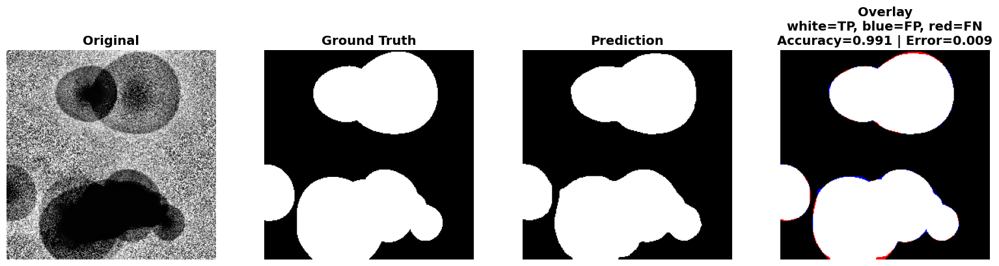

synth_frame_102.png: Dice=0.9714, IoU=0.9445, PixelError=0.0234
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_102.png


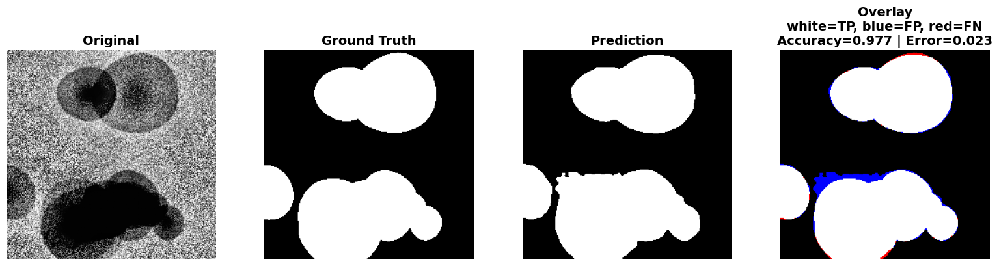

synth_frame_199.png: Dice=0.9772, IoU=0.9554, PixelError=0.0186
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_199.png


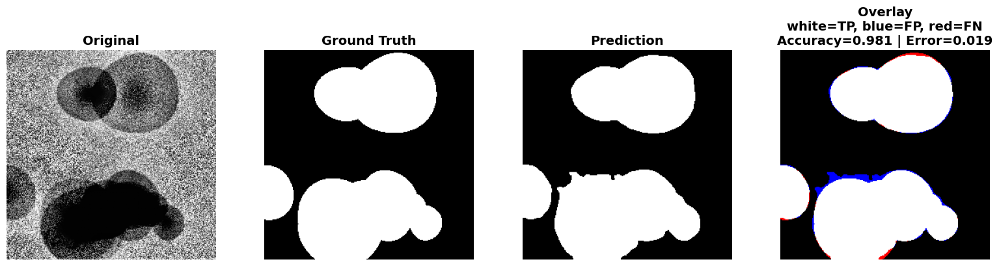

Average Dice: 0.9768 | IoU: 0.9547 | Pixel Accuracy: 0.9815 | Pixel Error: 0.0185


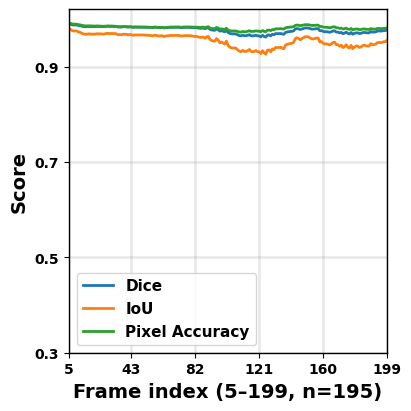

[SANITY] predicted frames: 195
[SANITY] first/last indices: 5 … 199


In [ ]:
# use the 5 masks lightly, then fade them out
model.hint_scale_test = 0.12      # small but nonzero → encoder can “see” the hint
model.hint_min_scale  = 0.03      # floor so the hint never fully vanishes
model.hint_decay_tau  = 60        # slower decay → more stable early frames

ret = model.predict_test_dataset(
    test_img_dir= DATA / "synthetic_test",
    test_gt_dir= DATA / "mask_test",
    use_first_n_masks=5,           # only first 5 masks are used (no leakage)
    edge_scale=0.30,                # initial hint strength before decay
    evaluate_test=True,
    gt_is_clean_binary=True,
    return_arrays=True
)

assert ret is not None
YIDX = ret["y_idx"].astype(int)
print(f"[SANITY] predicted frames: {len(YIDX)}")
print(f"[SANITY] first/last indices: {YIDX[0]} … {YIDX[-1]}")

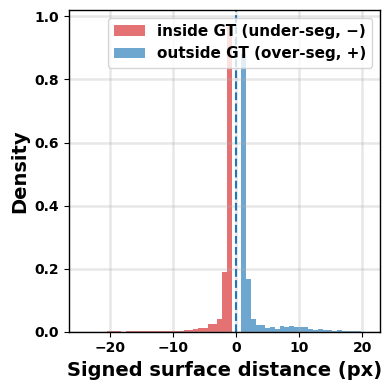

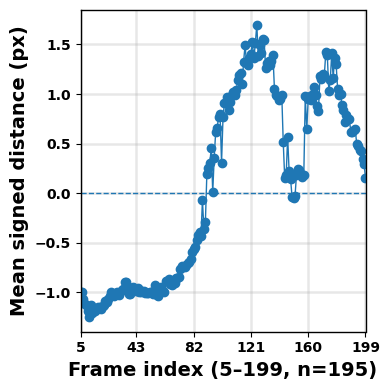

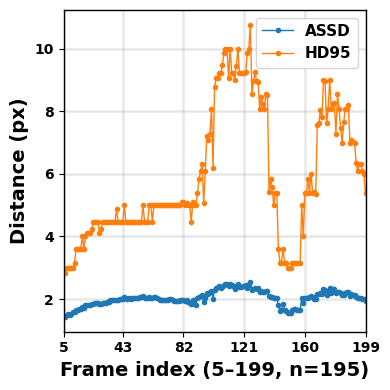

[SUMMARY over 195 frames] ASSD median=2.032px | HD95 median=5.000px | mean signed (overall)=0.078px


In [ ]:
# ==== Surface-distance evaluation (histogram + time series) ====
import re, numpy as np, cv2, matplotlib.pyplot as plt
from pathlib import Path
from skimage.io import imread
from scipy.ndimage import distance_transform_edt as edt

def _num_key(p: Path):
    m = re.findall(r'\d+', p.stem)
    return int(m[-1]) if m else None

def signed_dt(mask_bin: np.ndarray) -> np.ndarray:
    """
    Signed distance transform of a binary mask (1=FG, GT in our use).
    Using sdt = edt(~m) - edt(m):
      negative -> inside GT (under-seg)
      positive -> outside GT (over-seg)
    """
    m = mask_bin.astype(bool)
    d_out = edt(~m)
    d_in  = edt(m)
    return d_out - d_in

def boundary(mask_bin: np.ndarray) -> np.ndarray:
    k = np.ones((3,3), np.uint8)
    er = cv2.erode(mask_bin.astype(np.uint8), k, iterations=1)
    return (mask_bin.astype(np.uint8) ^ er).astype(np.uint8)

def hausdorff95(sym_dists_abs: np.ndarray) -> float:
    return np.nan if sym_dists_abs.size == 0 else float(np.percentile(sym_dists_abs, 95))

def assd_from_sym(sym_dists_abs: np.ndarray) -> float:
    return np.nan if sym_dists_abs.size == 0 else float(np.mean(sym_dists_abs))

# --- gather arrays from predict_test_dataset(..., return_arrays=True) ---
assert ret is not None, "ret is None — call predict_test_dataset(..., return_arrays=True) first."
D    = ret["decoded"]                 # (T_pred,H,W) raw probabilities
YIDX = ret["y_idx"].astype(int)       # global frame indices
ROIh, ROIw = D.shape[1:]

# --- map GT files and align with predicted frames ---
test_gt_dir = Path(DATA / "mask_test")
gt_map = { _num_key(f): f for f in test_gt_dir.glob("*") if _num_key(f) is not None }

sel = [i for i,k in enumerate(YIDX) if k in gt_map]
if not sel:
    raise RuntimeError("No overlapping GT for predicted frames; check filenames/numbering.")
#sel = sel[:200]

all_signed = []
ts_mean_signed, ts_assd, ts_hd95, ts_idx = [], [], [], []

for i in sel:
    k      = int(YIDX[i])
    pred_p = D[i]
    pred_b = model.clean_edges(pred_p).astype(np.uint8)

    gt_im = imread(str(gt_map[k]))
    if gt_im.ndim == 3: gt_im = gt_im[...,0]
    gt_crop = model.crop_to_roi(gt_im)
    gt_bin  = (gt_crop > 127).astype(np.uint8)

    if pred_b.shape != gt_bin.shape:
        pred_b = cv2.resize(pred_b, (gt_bin.shape[1], gt_bin.shape[0]), interpolation=cv2.INTER_NEAREST)

    sdt_gt = signed_dt(gt_bin)
    Bp = boundary(pred_b)
    signed_pred_to_gt = sdt_gt[Bp > 0]               # < 0: inside GT (under-seg), > 0: outside GT (over-seg)

    sdt_pred = signed_dt(pred_b)
    Bg = boundary(gt_bin)
    abs_gt_to_pred = np.abs(sdt_pred[Bg > 0])
    abs_pred_to_gt = np.abs(signed_pred_to_gt)
    sym_abs = np.concatenate([abs_gt_to_pred, abs_pred_to_gt], axis=0) if (abs_gt_to_pred.size or abs_pred_to_gt.size) else np.array([])

    if signed_pred_to_gt.size:
        all_signed.append(signed_pred_to_gt)
        ts_mean_signed.append(float(np.mean(signed_pred_to_gt)))
    else:
        ts_mean_signed.append(np.nan)

    ts_assd.append(assd_from_sym(sym_abs))
    ts_hd95.append(hausdorff95(sym_abs))
    ts_idx.append(k)

if not all_signed:
    raise RuntimeError("No boundary pixels collected. Check masks or thresholds.")
all_signed = np.concatenate(all_signed, axis=0)

# 1) Signed distance histogram
plt.figure(figsize=(4.0,4.0))
neg = all_signed[all_signed < 0]     # inside GT  -> under-seg
pos = all_signed[all_signed >= 0]    # outside GT -> over-seg
bins = np.linspace(min(-5, np.min(all_signed)), max(5, np.max(all_signed)), 60)


FP_COLOR = '#1f77b4'   # blue  (outside GT → FP / over-seg / +)
FN_COLOR = '#d62728'   # red   (inside GT  → FN / under-seg / −)
plt.hist(neg, bins=bins, alpha=0.65, label="inside GT (under-seg, −)", density=True, color=FN_COLOR)
plt.hist(pos, bins=bins, alpha=0.65, label="outside GT (over-seg, +)", density=True, color=FP_COLOR)
plt.axvline(0, linestyle="--")
plt.xlabel("Signed surface distance (px)")
plt.ylabel("Density")
#plt.title("Prediction–GT surface distance (signed)\n(− inside / + outside)")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# 2) Time series
#ts_idx         = np.array(ts_idx)
ts_idx = np.array(ts_idx, dtype=int)
xmin, xmax = int(ts_idx.min()), int(ts_idx.max())
xticks = np.linspace(xmin, xmax, 6, dtype=int)
ts_mean_signed = np.array(ts_mean_signed)
ts_assd        = np.array(ts_assd)
ts_hd95        = np.array(ts_hd95)

plt.figure(figsize=(4.0,4.0))
plt.plot(ts_idx, ts_mean_signed, marker='o', linewidth=1)
plt.axhline(0, linestyle="--", linewidth=1)
plt.xlim(xmin, xmax); plt.xticks(xticks)
plt.xlabel(f"Frame index ({xmin}–{xmax}, n={len(ts_idx)})")
plt.ylabel("Mean signed distance (px)")
plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

plt.figure(figsize=(4.0,4.0))
plt.plot(ts_idx, ts_assd, marker='.', linewidth=1, label="ASSD")
plt.plot(ts_idx, ts_hd95, marker='.', linewidth=1, label="HD95")
plt.xlim(xmin, xmax); plt.xticks(xticks)
plt.xlabel(f"Frame index ({xmin}–{xmax}, n={len(ts_idx)})")
plt.ylabel("Distance (px)")
plt.legend(); plt.grid(alpha=0.3); plt.tight_layout(); plt.show()


print(f"[SUMMARY over {len(sel)} frames] "
      f"ASSD median={np.nanmedian(ts_assd):.3f}px | "
      f"HD95 median={np.nanmedian(ts_hd95):.3f}px | "
      f"mean signed (overall)={np.nanmean(ts_mean_signed):.3f}px")

### Scenario C: Two separated clusters in different parts of the image (smooth change)

[DEBUG] test_edges stats per first frames: [(0.0, 0.14957427978515625, 0.30000001192092896), (0.0, 0.15044860541820526, 0.30000001192092896), (0.0, 0.15131835639476776, 0.30000001192092896), (0.0, 0.15241698920726776, 0.30000001192092896), (0.0, 0.15329131484031677, 0.30000001192092896)]
[DEBUG] decoded min/mean/max: 2.1563541733165524e-27 0.500373363494873 1.0
synth_frame_005.png: Dice=0.9887, IoU=0.9776, PixelError=0.0116
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_005.png


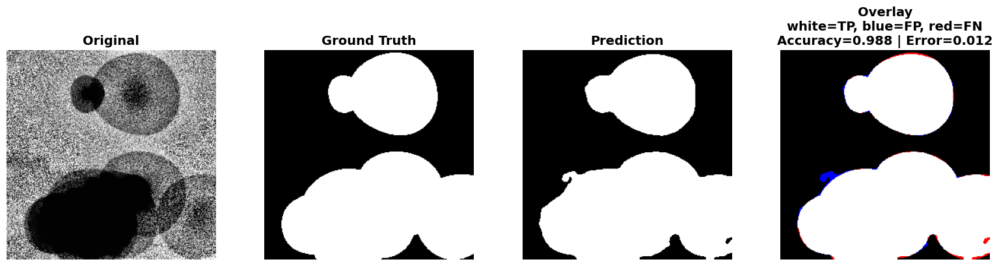

synth_frame_102.png: Dice=0.9793, IoU=0.9595, PixelError=0.0205
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_102.png


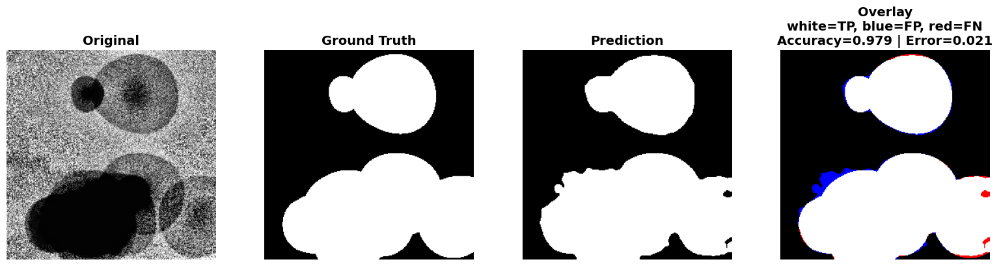

synth_frame_199.png: Dice=0.9742, IoU=0.9496, PixelError=0.0257
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_199.png


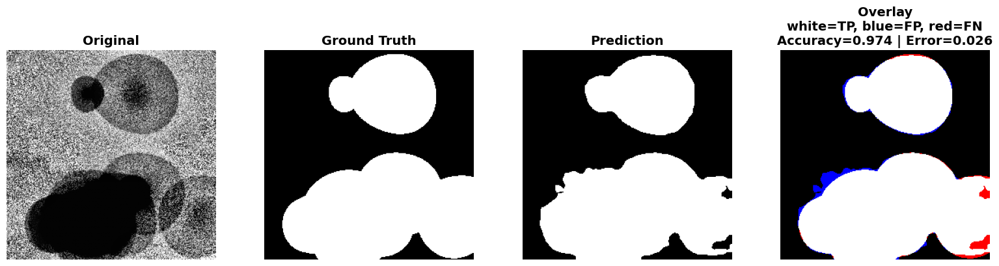

Average Dice: 0.9791 | IoU: 0.9591 | Pixel Accuracy: 0.9795 | Pixel Error: 0.0205


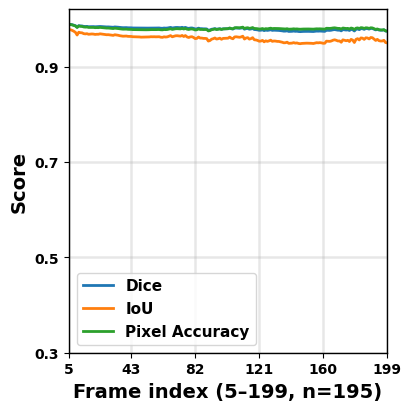

[SANITY] predicted frames: 195
[SANITY] first/last indices: 5 … 199


In [ ]:
# use the 5 masks lightly, then fade them out
model.hint_scale_test = 0.12      # small but nonzero → encoder can “see” the hint
model.hint_min_scale  = 0.03      # floor so the hint never fully vanishes
model.hint_decay_tau  = 60        # slower decay → more stable early frames

ret = model.predict_test_dataset(
    test_img_dir= DATA / "synthetic_test",
    test_gt_dir= DATA / "mask_test",
    use_first_n_masks=5,           # only first 5 masks are used (no leakage)
    edge_scale=0.30,                # initial hint strength before decay
    evaluate_test=True,
    gt_is_clean_binary=True,
    return_arrays=True
)

assert ret is not None
YIDX = ret["y_idx"].astype(int)
print(f"[SANITY] predicted frames: {len(YIDX)}")
print(f"[SANITY] first/last indices: {YIDX[0]} … {YIDX[-1]}")

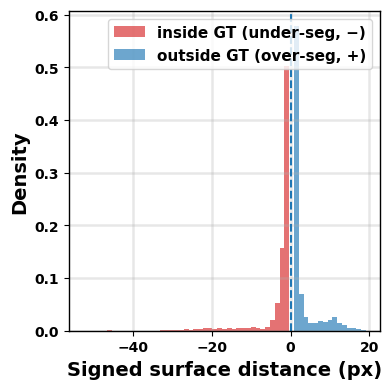

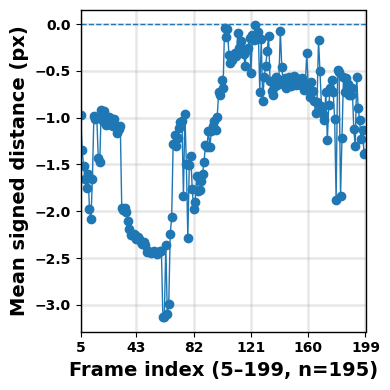

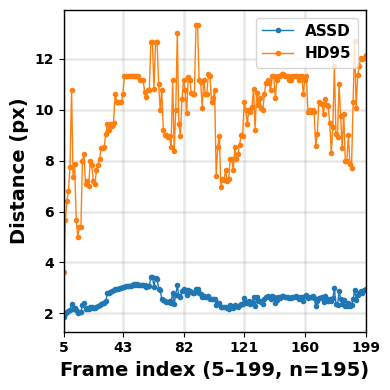

[SUMMARY over 195 frames] ASSD median=2.605px | HD95 median=10.257px | mean signed (overall)=-1.150px


In [ ]:
# ==== Surface-distance evaluation (histogram + time series) ====
import re, numpy as np, cv2, matplotlib.pyplot as plt
from pathlib import Path
from skimage.io import imread
from scipy.ndimage import distance_transform_edt as edt

def _num_key(p: Path):
    m = re.findall(r'\d+', p.stem)
    return int(m[-1]) if m else None

def signed_dt(mask_bin: np.ndarray) -> np.ndarray:
    """
    Signed distance transform of a binary mask (1=FG, GT in our use).
    Using sdt = edt(~m) - edt(m):
      negative -> inside GT (under-seg)
      positive -> outside GT (over-seg)
    """
    m = mask_bin.astype(bool)
    d_out = edt(~m)
    d_in  = edt(m)
    return d_out - d_in

def boundary(mask_bin: np.ndarray) -> np.ndarray:
    k = np.ones((3,3), np.uint8)
    er = cv2.erode(mask_bin.astype(np.uint8), k, iterations=1)
    return (mask_bin.astype(np.uint8) ^ er).astype(np.uint8)

def hausdorff95(sym_dists_abs: np.ndarray) -> float:
    return np.nan if sym_dists_abs.size == 0 else float(np.percentile(sym_dists_abs, 95))

def assd_from_sym(sym_dists_abs: np.ndarray) -> float:
    return np.nan if sym_dists_abs.size == 0 else float(np.mean(sym_dists_abs))

# --- gather arrays from predict_test_dataset(..., return_arrays=True) ---
assert ret is not None, "ret is None — call predict_test_dataset(..., return_arrays=True) first."
D    = ret["decoded"]                 # (T_pred,H,W) raw probabilities
YIDX = ret["y_idx"].astype(int)       # global frame indices
ROIh, ROIw = D.shape[1:]

# --- map GT files and align with predicted frames ---
test_gt_dir = Path(DATA / "mask_test")
gt_map = { _num_key(f): f for f in test_gt_dir.glob("*") if _num_key(f) is not None }

sel = [i for i,k in enumerate(YIDX) if k in gt_map]
if not sel:
    raise RuntimeError("No overlapping GT for predicted frames; check filenames/numbering.")
#sel = sel[:200]

all_signed = []
ts_mean_signed, ts_assd, ts_hd95, ts_idx = [], [], [], []

for i in sel:
    k      = int(YIDX[i])
    pred_p = D[i]
    pred_b = model.clean_edges(pred_p).astype(np.uint8)

    gt_im = imread(str(gt_map[k]))
    if gt_im.ndim == 3: gt_im = gt_im[...,0]
    gt_crop = model.crop_to_roi(gt_im)
    gt_bin  = (gt_crop > 127).astype(np.uint8)

    if pred_b.shape != gt_bin.shape:
        pred_b = cv2.resize(pred_b, (gt_bin.shape[1], gt_bin.shape[0]), interpolation=cv2.INTER_NEAREST)

    sdt_gt = signed_dt(gt_bin)
    Bp = boundary(pred_b)
    signed_pred_to_gt = sdt_gt[Bp > 0]               # < 0: inside GT (under-seg), > 0: outside GT (over-seg)

    sdt_pred = signed_dt(pred_b)
    Bg = boundary(gt_bin)
    abs_gt_to_pred = np.abs(sdt_pred[Bg > 0])
    abs_pred_to_gt = np.abs(signed_pred_to_gt)
    sym_abs = np.concatenate([abs_gt_to_pred, abs_pred_to_gt], axis=0) if (abs_gt_to_pred.size or abs_pred_to_gt.size) else np.array([])

    if signed_pred_to_gt.size:
        all_signed.append(signed_pred_to_gt)
        ts_mean_signed.append(float(np.mean(signed_pred_to_gt)))
    else:
        ts_mean_signed.append(np.nan)

    ts_assd.append(assd_from_sym(sym_abs))
    ts_hd95.append(hausdorff95(sym_abs))
    ts_idx.append(k)

if not all_signed:
    raise RuntimeError("No boundary pixels collected. Check masks or thresholds.")
all_signed = np.concatenate(all_signed, axis=0)

# 1) Signed distance histogram
plt.figure(figsize=(4.0,4.0))
neg = all_signed[all_signed < 0]     # inside GT  -> under-seg
pos = all_signed[all_signed >= 0]    # outside GT -> over-seg
bins = np.linspace(min(-5, np.min(all_signed)), max(5, np.max(all_signed)), 60)


FP_COLOR = '#1f77b4'   # blue  (outside GT → FP / over-seg / +)
FN_COLOR = '#d62728'   # red   (inside GT  → FN / under-seg / −)
plt.hist(neg, bins=bins, alpha=0.65, label="inside GT (under-seg, −)", density=True, color=FN_COLOR)
plt.hist(pos, bins=bins, alpha=0.65, label="outside GT (over-seg, +)", density=True, color=FP_COLOR)
plt.axvline(0, linestyle="--")
plt.xlabel("Signed surface distance (px)")
plt.ylabel("Density")
#plt.title("Prediction–GT surface distance (signed)\n(− inside / + outside)")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# 2) Time series
#ts_idx         = np.array(ts_idx)
ts_idx = np.array(ts_idx, dtype=int)
xmin, xmax = int(ts_idx.min()), int(ts_idx.max())
xticks = np.linspace(xmin, xmax, 6, dtype=int)
ts_mean_signed = np.array(ts_mean_signed)
ts_assd        = np.array(ts_assd)
ts_hd95        = np.array(ts_hd95)

plt.figure(figsize=(4.0,4.0))
plt.plot(ts_idx, ts_mean_signed, marker='o', linewidth=1)
plt.axhline(0, linestyle="--", linewidth=1)
plt.xlim(xmin, xmax); plt.xticks(xticks)
plt.xlabel(f"Frame index ({xmin}–{xmax}, n={len(ts_idx)})")
plt.ylabel("Mean signed distance (px)")
plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

plt.figure(figsize=(4.0,4.0))
plt.plot(ts_idx, ts_assd, marker='.', linewidth=1, label="ASSD")
plt.plot(ts_idx, ts_hd95, marker='.', linewidth=1, label="HD95")
plt.xlim(xmin, xmax); plt.xticks(xticks)
plt.xlabel(f"Frame index ({xmin}–{xmax}, n={len(ts_idx)})")
plt.ylabel("Distance (px)")
plt.legend(); plt.grid(alpha=0.3); plt.tight_layout(); plt.show()


print(f"[SUMMARY over {len(sel)} frames] "
      f"ASSD median={np.nanmedian(ts_assd):.3f}px | "
      f"HD95 median={np.nanmedian(ts_hd95):.3f}px | "
      f"mean signed (overall)={np.nanmean(ts_mean_signed):.3f}px")

### Scenario A: Multi-particle, large motion/size changes

[DEBUG] test_edges stats per first frames: [(0.0, 0.12050171196460724, 0.30000001192092896), (0.0, 0.12115630507469177, 0.30000001192092896), (0.0, 0.12193907797336578, 0.30000001192092896), (0.0, 0.12268981337547302, 0.30000001192092896), (0.0, 0.12363280355930328, 0.30000001192092896)]
[DEBUG] decoded min/mean/max: 3.63365298904037e-28 0.5049391388893127 1.0
synth_frame_005.png: Dice=0.9870, IoU=0.9744, PixelError=0.0108
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_005.png


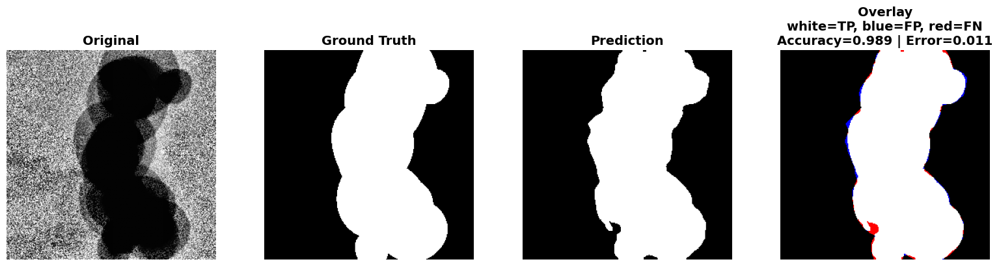

synth_frame_102.png: Dice=0.9351, IoU=0.8782, PixelError=0.0630
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_102.png


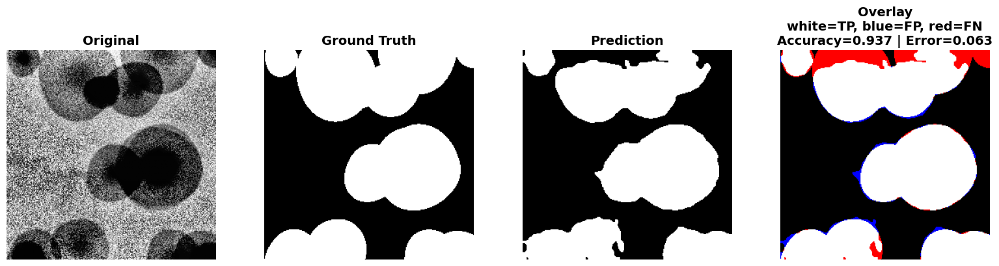

synth_frame_199.png: Dice=0.8891, IoU=0.8003, PixelError=0.0954
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_199.png


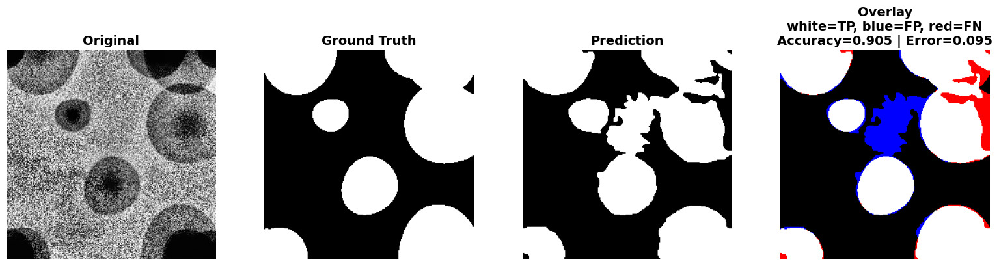

Average Dice: 0.9414 | IoU: 0.8912 | Pixel Accuracy: 0.9457 | Pixel Error: 0.0543


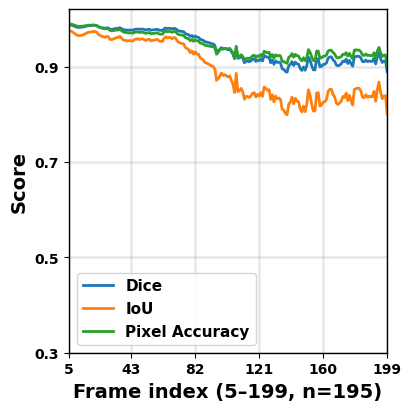

[SANITY] predicted frames: 195
[SANITY] first/last indices: 5 … 199


In [ ]:
# use the 5 masks lightly, then fade them out
model.hint_scale_test = 0.12      # small but nonzero → encoder can “see” the hint
model.hint_min_scale  = 0.03      # floor so the hint never fully vanishes
model.hint_decay_tau  = 60        # slower decay → more stable early frames

ret = model.predict_test_dataset(
    test_img_dir= DATA / "synthetic_test",
    test_gt_dir= DATA / "mask_test",
    use_first_n_masks=5,           # only first 5 masks are used (no leakage)
    edge_scale=0.30,                # initial hint strength before decay
    evaluate_test=True,
    gt_is_clean_binary=True,
    return_arrays=True
)

assert ret is not None
YIDX = ret["y_idx"].astype(int)
print(f"[SANITY] predicted frames: {len(YIDX)}")
print(f"[SANITY] first/last indices: {YIDX[0]} … {YIDX[-1]}")

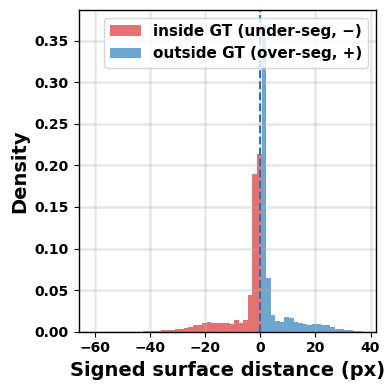

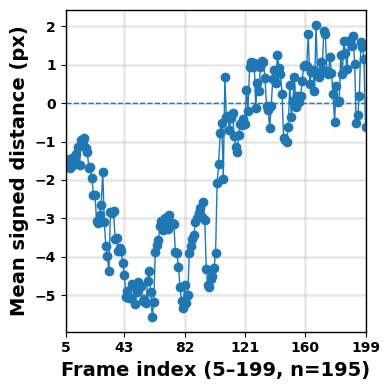

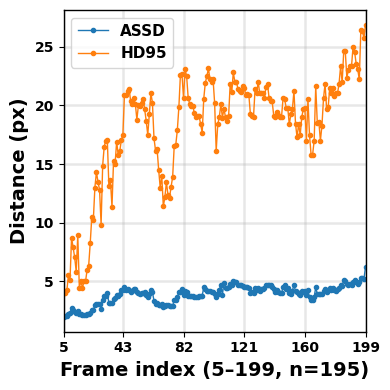

[SUMMARY over 195 frames] ASSD median=4.088px | HD95 median=19.662px | mean signed (overall)=-1.572px


In [ ]:
# ==== Surface-distance evaluation (histogram + time series) ====
import re, numpy as np, cv2, matplotlib.pyplot as plt
from pathlib import Path
from skimage.io import imread
from scipy.ndimage import distance_transform_edt as edt

def _num_key(p: Path):
    m = re.findall(r'\d+', p.stem)
    return int(m[-1]) if m else None

def signed_dt(mask_bin: np.ndarray) -> np.ndarray:
    """
    Signed distance transform of a binary mask (1=FG, GT in our use).
    Using sdt = edt(~m) - edt(m):
      negative -> inside GT (under-seg)
      positive -> outside GT (over-seg)
    """
    m = mask_bin.astype(bool)
    d_out = edt(~m)
    d_in  = edt(m)
    return d_out - d_in

def boundary(mask_bin: np.ndarray) -> np.ndarray:
    k = np.ones((3,3), np.uint8)
    er = cv2.erode(mask_bin.astype(np.uint8), k, iterations=1)
    return (mask_bin.astype(np.uint8) ^ er).astype(np.uint8)

def hausdorff95(sym_dists_abs: np.ndarray) -> float:
    return np.nan if sym_dists_abs.size == 0 else float(np.percentile(sym_dists_abs, 95))

def assd_from_sym(sym_dists_abs: np.ndarray) -> float:
    return np.nan if sym_dists_abs.size == 0 else float(np.mean(sym_dists_abs))

# --- gather arrays from predict_test_dataset(..., return_arrays=True) ---
assert ret is not None, "ret is None — call predict_test_dataset(..., return_arrays=True) first."
D    = ret["decoded"]                 # (T_pred,H,W) raw probabilities
YIDX = ret["y_idx"].astype(int)       # global frame indices
ROIh, ROIw = D.shape[1:]

# --- map GT files and align with predicted frames ---
test_gt_dir = Path(DATA / "mask_test")
gt_map = { _num_key(f): f for f in test_gt_dir.glob("*") if _num_key(f) is not None }

sel = [i for i,k in enumerate(YIDX) if k in gt_map]
if not sel:
    raise RuntimeError("No overlapping GT for predicted frames; check filenames/numbering.")
#sel = sel[:200]

all_signed = []
ts_mean_signed, ts_assd, ts_hd95, ts_idx = [], [], [], []

for i in sel:
    k      = int(YIDX[i])
    pred_p = D[i]
    pred_b = model.clean_edges(pred_p).astype(np.uint8)

    gt_im = imread(str(gt_map[k]))
    if gt_im.ndim == 3: gt_im = gt_im[...,0]
    gt_crop = model.crop_to_roi(gt_im)
    gt_bin  = (gt_crop > 127).astype(np.uint8)

    if pred_b.shape != gt_bin.shape:
        pred_b = cv2.resize(pred_b, (gt_bin.shape[1], gt_bin.shape[0]), interpolation=cv2.INTER_NEAREST)

    sdt_gt = signed_dt(gt_bin)
    Bp = boundary(pred_b)
    signed_pred_to_gt = sdt_gt[Bp > 0]               # < 0: inside GT (under-seg), > 0: outside GT (over-seg)

    sdt_pred = signed_dt(pred_b)
    Bg = boundary(gt_bin)
    abs_gt_to_pred = np.abs(sdt_pred[Bg > 0])
    abs_pred_to_gt = np.abs(signed_pred_to_gt)
    sym_abs = np.concatenate([abs_gt_to_pred, abs_pred_to_gt], axis=0) if (abs_gt_to_pred.size or abs_pred_to_gt.size) else np.array([])

    if signed_pred_to_gt.size:
        all_signed.append(signed_pred_to_gt)
        ts_mean_signed.append(float(np.mean(signed_pred_to_gt)))
    else:
        ts_mean_signed.append(np.nan)

    ts_assd.append(assd_from_sym(sym_abs))
    ts_hd95.append(hausdorff95(sym_abs))
    ts_idx.append(k)

if not all_signed:
    raise RuntimeError("No boundary pixels collected. Check masks or thresholds.")
all_signed = np.concatenate(all_signed, axis=0)

# 1) Signed distance histogram
plt.figure(figsize=(4.0,4.0))
neg = all_signed[all_signed < 0]     # inside GT  -> under-seg
pos = all_signed[all_signed >= 0]    # outside GT -> over-seg
bins = np.linspace(min(-5, np.min(all_signed)), max(5, np.max(all_signed)), 60)


FP_COLOR = '#1f77b4'   # blue  (outside GT → FP / over-seg / +)
FN_COLOR = '#d62728'   # red   (inside GT  → FN / under-seg / −)
plt.hist(neg, bins=bins, alpha=0.65, label="inside GT (under-seg, −)", density=True, color=FN_COLOR)
plt.hist(pos, bins=bins, alpha=0.65, label="outside GT (over-seg, +)", density=True, color=FP_COLOR)
plt.axvline(0, linestyle="--")
plt.xlabel("Signed surface distance (px)")
plt.ylabel("Density")
#plt.title("Prediction–GT surface distance (signed)\n(− inside / + outside)")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# 2) Time series
#ts_idx         = np.array(ts_idx)
ts_idx = np.array(ts_idx, dtype=int)
xmin, xmax = int(ts_idx.min()), int(ts_idx.max())
xticks = np.linspace(xmin, xmax, 6, dtype=int)
ts_mean_signed = np.array(ts_mean_signed)
ts_assd        = np.array(ts_assd)
ts_hd95        = np.array(ts_hd95)

plt.figure(figsize=(4.0,4.0))
plt.plot(ts_idx, ts_mean_signed, marker='o', linewidth=1)
plt.axhline(0, linestyle="--", linewidth=1)
plt.xlim(xmin, xmax); plt.xticks(xticks)
plt.xlabel(f"Frame index ({xmin}–{xmax}, n={len(ts_idx)})")
plt.ylabel("Mean signed distance (px)")
plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

plt.figure(figsize=(4.0,4.0))
plt.plot(ts_idx, ts_assd, marker='.', linewidth=1, label="ASSD")
plt.plot(ts_idx, ts_hd95, marker='.', linewidth=1, label="HD95")
plt.xlim(xmin, xmax); plt.xticks(xticks)
plt.xlabel(f"Frame index ({xmin}–{xmax}, n={len(ts_idx)})")
plt.ylabel("Distance (px)")
plt.legend(); plt.grid(alpha=0.3); plt.tight_layout(); plt.show()


print(f"[SUMMARY over {len(sel)} frames] "
      f"ASSD median={np.nanmedian(ts_assd):.3f}px | "
      f"HD95 median={np.nanmedian(ts_hd95):.3f}px | "
      f"mean signed (overall)={np.nanmean(ts_mean_signed):.3f}px")

### Scenario C: Two separated clusters in different parts of the image (smooth change)

[DEBUG] test_edges stats per first frames: [(0.0, 0.14485931396484375, 0.30000001192092896), (0.0, 0.14559631049633026, 0.30000001192092896), (0.0, 0.14644774794578552, 0.30000001192092896), (0.0, 0.14716187119483948, 0.30000001192092896), (0.0, 0.14783935248851776, 0.30000001192092896)]
[DEBUG] decoded min/mean/max: 1.8376950632773605e-24 0.4785596430301666 1.0
synth_frame_005.png: Dice=0.9865, IoU=0.9733, PixelError=0.0133
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_005.png


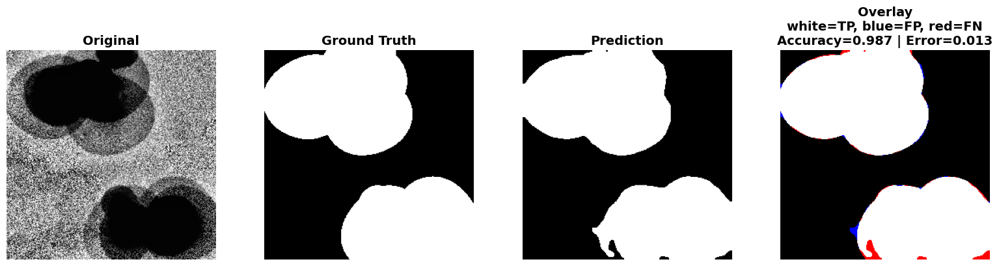

synth_frame_102.png: Dice=0.9801, IoU=0.9609, PixelError=0.0189
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_102.png


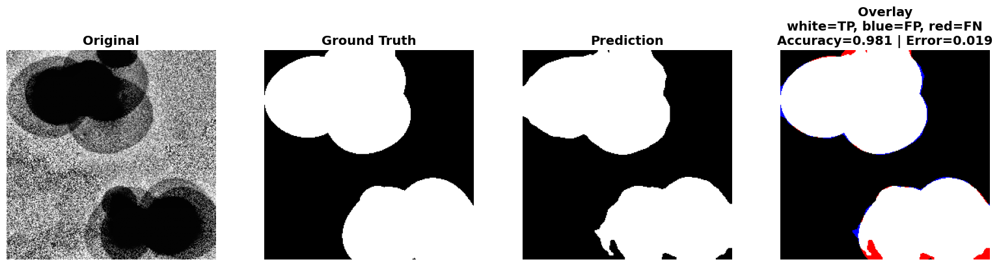

synth_frame_199.png: Dice=0.9803, IoU=0.9613, PixelError=0.0188
[Saved] /mnt/bcache/work/m.azimi/GIT_repositories/juspice/MoAz_data/results_frames/figures/overlay_fp_fn_synth_frame_199.png


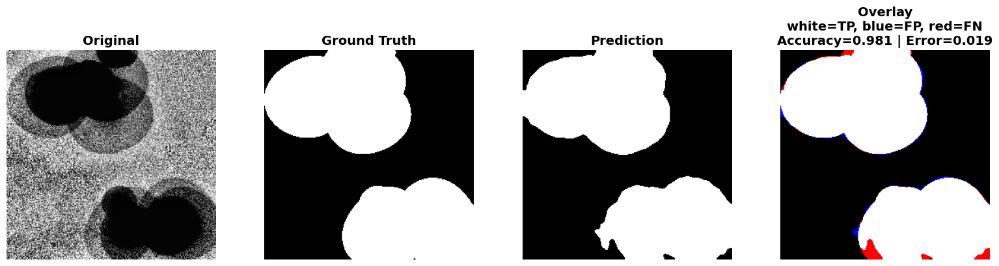

Average Dice: 0.9804 | IoU: 0.9617 | Pixel Accuracy: 0.9822 | Pixel Error: 0.0178


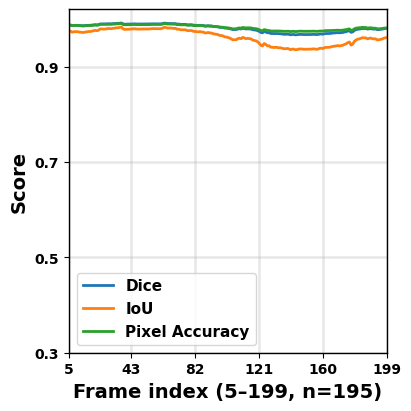

[SANITY] predicted frames: 195
[SANITY] first/last indices: 5 … 199


In [ ]:
# use the 5 masks lightly, then fade them out
model.hint_scale_test = 0.12      # small but nonzero → encoder can “see” the hint
model.hint_min_scale  = 0.03      # floor so the hint never fully vanishes
model.hint_decay_tau  = 60        # slower decay → more stable early frames

ret = model.predict_test_dataset(
    test_img_dir= DATA / "synthetic_test",
    test_gt_dir= DATA / "mask_test",
    use_first_n_masks=5,           # only first 5 masks are used (no leakage)
    edge_scale=0.30,                # initial hint strength before decay
    evaluate_test=True,
    gt_is_clean_binary=True,
    return_arrays=True
)

assert ret is not None
YIDX = ret["y_idx"].astype(int)
print(f"[SANITY] predicted frames: {len(YIDX)}")
print(f"[SANITY] first/last indices: {YIDX[0]} … {YIDX[-1]}")

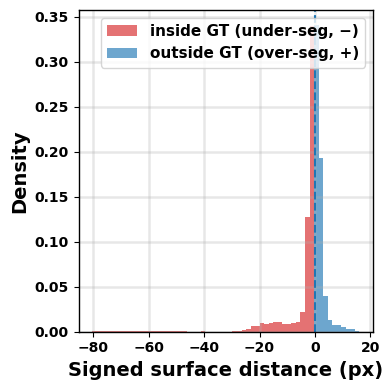

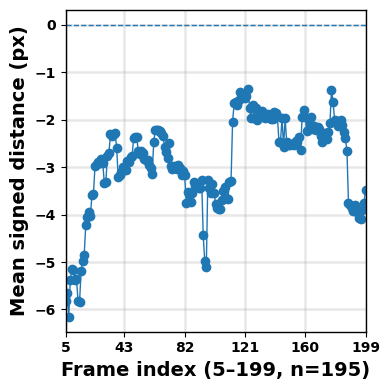

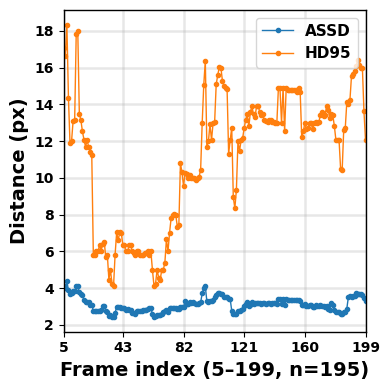

[SUMMARY over 195 frames] ASSD median=3.093px | HD95 median=12.530px | mean signed (overall)=-2.914px


In [ ]:
# ==== Surface-distance evaluation (histogram + time series) ====
import re, numpy as np, cv2, matplotlib.pyplot as plt
from pathlib import Path
from skimage.io import imread
from scipy.ndimage import distance_transform_edt as edt

def _num_key(p: Path):
    m = re.findall(r'\d+', p.stem)
    return int(m[-1]) if m else None

def signed_dt(mask_bin: np.ndarray) -> np.ndarray:
    """
    Signed distance transform of a binary mask (1=FG, GT in our use).
    Using sdt = edt(~m) - edt(m):
      negative -> inside GT (under-seg)
      positive -> outside GT (over-seg)
    """
    m = mask_bin.astype(bool)
    d_out = edt(~m)
    d_in  = edt(m)
    return d_out - d_in

def boundary(mask_bin: np.ndarray) -> np.ndarray:
    k = np.ones((3,3), np.uint8)
    er = cv2.erode(mask_bin.astype(np.uint8), k, iterations=1)
    return (mask_bin.astype(np.uint8) ^ er).astype(np.uint8)

def hausdorff95(sym_dists_abs: np.ndarray) -> float:
    return np.nan if sym_dists_abs.size == 0 else float(np.percentile(sym_dists_abs, 95))

def assd_from_sym(sym_dists_abs: np.ndarray) -> float:
    return np.nan if sym_dists_abs.size == 0 else float(np.mean(sym_dists_abs))

# --- gather arrays from predict_test_dataset(..., return_arrays=True) ---
assert ret is not None, "ret is None — call predict_test_dataset(..., return_arrays=True) first."
D    = ret["decoded"]                 # (T_pred,H,W) raw probabilities
YIDX = ret["y_idx"].astype(int)       # global frame indices
ROIh, ROIw = D.shape[1:]

# --- map GT files and align with predicted frames ---
test_gt_dir = Path(DATA / "mask_test")
gt_map = { _num_key(f): f for f in test_gt_dir.glob("*") if _num_key(f) is not None }

sel = [i for i,k in enumerate(YIDX) if k in gt_map]
if not sel:
    raise RuntimeError("No overlapping GT for predicted frames; check filenames/numbering.")
#sel = sel[:200]

all_signed = []
ts_mean_signed, ts_assd, ts_hd95, ts_idx = [], [], [], []

for i in sel:
    k      = int(YIDX[i])
    pred_p = D[i]
    pred_b = model.clean_edges(pred_p).astype(np.uint8)

    gt_im = imread(str(gt_map[k]))
    if gt_im.ndim == 3: gt_im = gt_im[...,0]
    gt_crop = model.crop_to_roi(gt_im)
    gt_bin  = (gt_crop > 127).astype(np.uint8)

    if pred_b.shape != gt_bin.shape:
        pred_b = cv2.resize(pred_b, (gt_bin.shape[1], gt_bin.shape[0]), interpolation=cv2.INTER_NEAREST)

    sdt_gt = signed_dt(gt_bin)
    Bp = boundary(pred_b)
    signed_pred_to_gt = sdt_gt[Bp > 0]               # < 0: inside GT (under-seg), > 0: outside GT (over-seg)

    sdt_pred = signed_dt(pred_b)
    Bg = boundary(gt_bin)
    abs_gt_to_pred = np.abs(sdt_pred[Bg > 0])
    abs_pred_to_gt = np.abs(signed_pred_to_gt)
    sym_abs = np.concatenate([abs_gt_to_pred, abs_pred_to_gt], axis=0) if (abs_gt_to_pred.size or abs_pred_to_gt.size) else np.array([])

    if signed_pred_to_gt.size:
        all_signed.append(signed_pred_to_gt)
        ts_mean_signed.append(float(np.mean(signed_pred_to_gt)))
    else:
        ts_mean_signed.append(np.nan)

    ts_assd.append(assd_from_sym(sym_abs))
    ts_hd95.append(hausdorff95(sym_abs))
    ts_idx.append(k)

if not all_signed:
    raise RuntimeError("No boundary pixels collected. Check masks or thresholds.")
all_signed = np.concatenate(all_signed, axis=0)

# 1) Signed distance histogram
plt.figure(figsize=(4.0,4.0))
neg = all_signed[all_signed < 0]     # inside GT  -> under-seg
pos = all_signed[all_signed >= 0]    # outside GT -> over-seg
bins = np.linspace(min(-5, np.min(all_signed)), max(5, np.max(all_signed)), 60)


FP_COLOR = '#1f77b4'   # blue  (outside GT → FP / over-seg / +)
FN_COLOR = '#d62728'   # red   (inside GT  → FN / under-seg / −)
plt.hist(neg, bins=bins, alpha=0.65, label="inside GT (under-seg, −)", density=True, color=FN_COLOR)
plt.hist(pos, bins=bins, alpha=0.65, label="outside GT (over-seg, +)", density=True, color=FP_COLOR)
plt.axvline(0, linestyle="--")
plt.xlabel("Signed surface distance (px)")
plt.ylabel("Density")
#plt.title("Prediction–GT surface distance (signed)\n(− inside / + outside)")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# 2) Time series
#ts_idx         = np.array(ts_idx)
ts_idx = np.array(ts_idx, dtype=int)
xmin, xmax = int(ts_idx.min()), int(ts_idx.max())
xticks = np.linspace(xmin, xmax, 6, dtype=int)
ts_mean_signed = np.array(ts_mean_signed)
ts_assd        = np.array(ts_assd)
ts_hd95        = np.array(ts_hd95)

plt.figure(figsize=(4.0,4.0))
plt.plot(ts_idx, ts_mean_signed, marker='o', linewidth=1)
plt.axhline(0, linestyle="--", linewidth=1)
plt.xlim(xmin, xmax); plt.xticks(xticks)
plt.xlabel(f"Frame index ({xmin}–{xmax}, n={len(ts_idx)})")
plt.ylabel("Mean signed distance (px)")
plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

plt.figure(figsize=(4.0,4.0))
plt.plot(ts_idx, ts_assd, marker='.', linewidth=1, label="ASSD")
plt.plot(ts_idx, ts_hd95, marker='.', linewidth=1, label="HD95")
plt.xlim(xmin, xmax); plt.xticks(xticks)
plt.xlabel(f"Frame index ({xmin}–{xmax}, n={len(ts_idx)})")
plt.ylabel("Distance (px)")
plt.legend(); plt.grid(alpha=0.3); plt.tight_layout(); plt.show()


print(f"[SUMMARY over {len(sel)} frames] "
      f"ASSD median={np.nanmedian(ts_assd):.3f}px | "
      f"HD95 median={np.nanmedian(ts_hd95):.3f}px | "
      f"mean signed (overall)={np.nanmean(ts_mean_signed):.3f}px")

### Real EM inference with pretrained LSTM+U-Net 

This cell runs inference on a real EM sequence using the models trained earlier, without requiring full ground-truth masks for evaluation.

- Forces a full-frame ROI (256×256) to match how the models were trained.

- Loads the three trained parts: encoder, ConvLSTM, and U-Net decoder (.h5 files).

- Seeds test-time hints with the first 5 available masks (use_first_n_masks=5), then:

Propagates them to later frames using optical flow (flow_warp=True).

Decays hint strength over time so the image channel carries more weight (`edge_scale=0.22`, `hint_decay_tau=80`, `floor at hint_min_scale=0.05`).

Produces per-frame probability maps (D), the hints actually used aligned to predicted frames (H), the predicted frame indices (YIDX), and ROI images (IMGS).

I0000 00:00:1756225466.509611 1523841 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22384 MB memory:  -> device: 0, name: NVIDIA A30, pci bus id: 0000:81:00.0, compute capability: 8.0
I0000 00:00:1756225466.516160 1523841 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 22384 MB memory:  -> device: 1, name: NVIDIA A30, pci bus id: 0000:a1:00.0, compute capability: 8.0


ENC out: (None, 64, 64, 112)  | LSTM in: (None, 5, 64, 64, 112)
[DEBUG] test_edges stats per first frames: [(0.0, 0.10138276219367981, 0.2199999988079071), (0.0, 0.10138276219367981, 0.2199999988079071), (0.0, 0.10282624512910843, 0.2199999988079071), (0.0, 0.10760986059904099, 0.2199999988079071), (0.0, 0.11742553859949112, 0.2199999988079071)]


I0000 00:00:1756225493.547259 1552444 service.cc:152] XLA service 0x5569d816d8f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1756225493.547294 1552444 service.cc:160]   StreamExecutor device (0): NVIDIA A30, Compute Capability 8.0
I0000 00:00:1756225493.547299 1552444 service.cc:160]   StreamExecutor device (1): NVIDIA A30, Compute Capability 8.0
2025-08-26 18:24:53.575839: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1756225493.656624 1552444 cuda_dnn.cc:529] Loaded cuDNN version 90501
I0000 00:00:1756225494.849501 1552444 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


[DEBUG] decoded min/mean/max: 8.482553201516474e-12 0.35929933190345764 1.0
[SHAPES] decoded=(893, 256, 256) | hints_aligned=(893, 256, 256) | imgs_aligned=(893, 256, 256)
[INDEX] first/last predicted global frame indices: 5 … 897
IoU(pred, HINT):  mean=0.006 | median=0.000
IoU(pred, EDGES): mean=0.047 | median=0.040
Temporal flip fraction (median across t>0): 0.0054


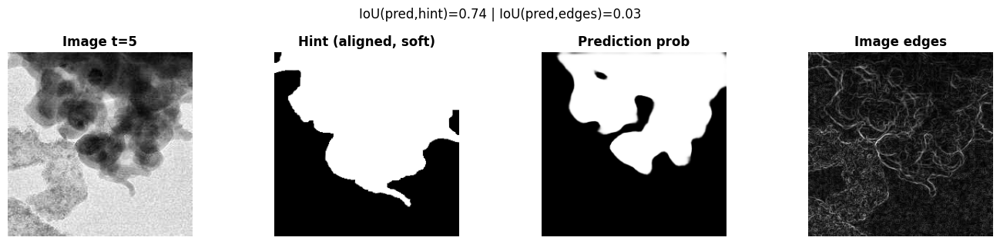

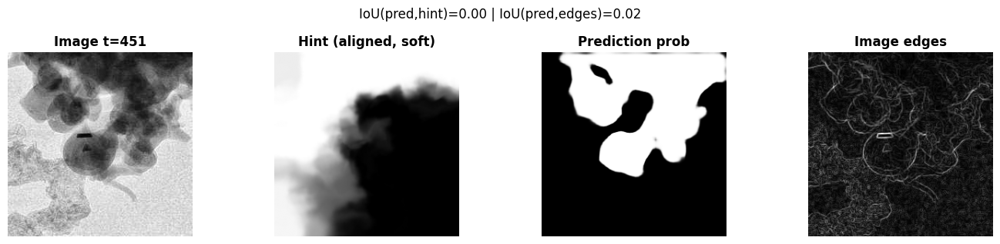

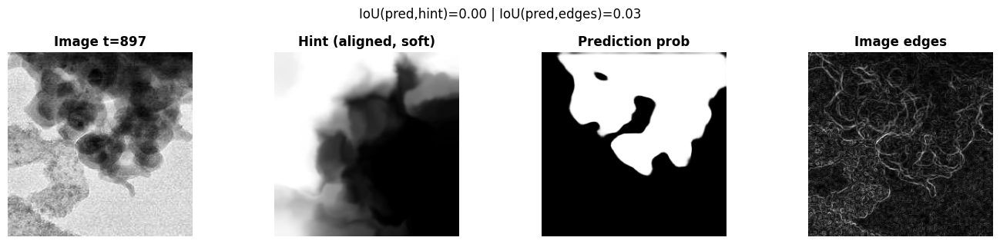

In [ ]:
from tensorflow.keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import sobel

# --- init (full frame ROI) ---
model = LSTM_BASED(
    syn_dir=".", gt_mask_dir=".",
    results_dir= RESULTS_DIR / "lstm_frames",
    force_full_frame=True
)
model.roi_x, model.roi_y, model.roi_w, model.roi_h = 0, 0, 256, 256

# --- inference-time knobs (balanced profile) ---
model.hint_scale_test = 0.12   # how strong the hint enters the encoder at test time
model.hint_min_scale  = 0.05   # floor after decay
model.hint_decay_tau  = 80.0   # frames; larger = slower decay
model.flow_warp       = True   # propagate early hints with optical flow

# --- load trained parts ---
model.encoder    = load_model(".../encoder_fold1.h5", compile=False)
model.lstm_model = load_model(".../lstm_model_fold1.h5", compile=False)
model.decoder    = load_model(
    ".../unet_decoder_fold1.h5",
    custom_objects={"dice_loss": LSTM_BASED.dice_loss, "dice_bce_loss": LSTM_BASED.dice_bce_loss},
    compile=False
)

print("ENC out:", model.encoder.output_shape, " | LSTM in:", model.lstm_model.input_shape)

# --- predict (seed with the first 5 GT masks you have) ---
ret = model.predict_test_dataset(
    test_img_dir=".../TiO2_5nm_1/resized_256",
    test_gt_dir=".../binary_masks_otsu",
    use_first_n_masks=5,        
    edge_scale=0.22,            # initial strength of those early hints before decay
    evaluate_test=False,        # set True only if GT overlaps predicted frames
    return_arrays=True
)
if ret is None:
    raise RuntimeError("predict_test_dataset must be called with return_arrays=True and return a dict.")

D    = ret["decoded"]      # (T_pred, H, W) predicted probabilities
HALL = ret["hints"]        # (T_all, H, W)
YIDX = ret["y_idx"]        # indices of predicted frames (global)
IMGS = ret["imgs"]         # (T_all, H, W)

# align hints/images with the predicted frames
H = np.stack([HALL[i] for i in YIDX], axis=0)
I = np.stack([IMGS[i] for i in YIDX], axis=0)

print(f"[SHAPES] decoded={D.shape} | hints_aligned={H.shape} | imgs_aligned={I.shape}")
print(f"[INDEX] first/last predicted global frame indices: {int(YIDX[0])} … {int(YIDX[-1])}")

# ---- quick diagnostics (no external GT) ----
def binarize(x, t): 
    return (x >= t).astype(np.uint8)

def iou(a, b):
    inter = (a & b).sum()
    union = (a | b).sum()
    return float(inter) / (float(union) + 1e-8)

TH_PRED = 0.60   # a bit stricter than 0.5; tweak 0.60–0.70 if needed
TH_HINT = 0.20
TH_EDGE = 0.30

# 1) binarize predictions and hints
P  = binarize(D, TH_PRED)
HB = binarize(H, TH_HINT)

# 2) per-frame image edges (for a crude image-alignment proxy)
E_list = []
for t in range(I.shape[0]):
    e = sobel(I[t])
    e = (e - e.min()) / (np.ptp(e) + 1e-8)
    E_list.append(e)
E  = np.stack(E_list, axis=0)
EB = binarize(E, TH_EDGE)

# 3) quick metrics
iou_hint = np.array([iou(P[t], HB[t]) for t in range(len(P))])
iou_edge = np.array([iou(P[t], EB[t]) for t in range(len(P))])
flip_frac = np.array([(P[t] ^ P[t-1]).mean() for t in range(1, len(P))])

print("IoU(pred, HINT):  mean={:.3f} | median={:.3f}".format(iou_hint.mean(), np.median(iou_hint)))
print("IoU(pred, EDGES): mean={:.3f} | median={:.3f}".format(iou_edge.mean(), np.median(iou_edge)))
print("Temporal flip fraction (median across t>0): {:.4f}".format(np.median(flip_frac)))

# 4) visualize a few frames
idxs = np.linspace(0, len(P)-1, 3, dtype=int)
for t in idxs:
    fig, axs = plt.subplots(1, 4, figsize=(14, 3.2))
    axs[0].imshow(I[t], cmap='gray'); axs[0].set_title(f"Image t={int(YIDX[t])}")
    axs[1].imshow(H[t], cmap='gray'); axs[1].set_title("Hint (aligned, soft)")
    axs[2].imshow(D[t], cmap='gray'); axs[2].set_title("Prediction prob")
    axs[3].imshow(E[t], cmap='gray'); axs[3].set_title("Image edges")
    for a in axs: a.axis('off')
    plt.suptitle(f"IoU(pred,hint)={iou_hint[t]:.2f} | IoU(pred,edges)={iou_edge[t]:.2f}")
    plt.tight_layout(); plt.show()

### Random frame quick-look (image, hint, prediction)

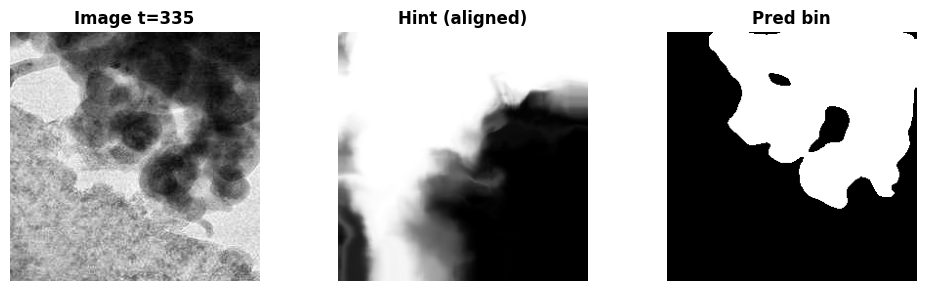

In [16]:
t = np.random.randint(0, len(YIDX))
plt.figure(figsize=(10,3))
plt.subplot(1,3,1); plt.imshow(I[t], cmap='gray'); plt.title(f"Image t={YIDX[t]}"); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(H[t], cmap='gray'); plt.title("Hint (aligned)"); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(P[t], cmap='gray'); plt.title("Pred bin"); plt.axis('off')
plt.tight_layout(); plt.show()

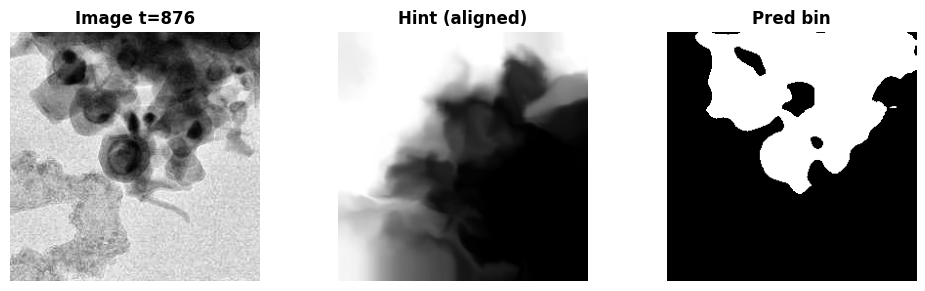

In [21]:
t = np.random.randint(0, len(YIDX))
plt.figure(figsize=(10,3))
plt.subplot(1,3,1); plt.imshow(I[t], cmap='gray'); plt.title(f"Image t={YIDX[t]}"); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(H[t], cmap='gray'); plt.title("Hint (aligned)"); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(P[t], cmap='gray'); plt.title("Pred bin"); plt.axis('off')
plt.tight_layout(); plt.show()

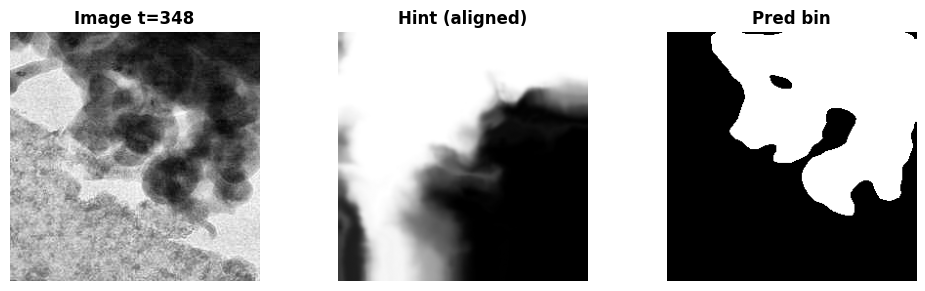

In [27]:
t = np.random.randint(0, len(YIDX))
plt.figure(figsize=(10,3))
plt.subplot(1,3,1); plt.imshow(I[t], cmap='gray'); plt.title(f"Image t={YIDX[t]}"); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(H[t], cmap='gray'); plt.title("Hint (aligned)"); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(P[t], cmap='gray'); plt.title("Pred bin"); plt.axis('off')
plt.tight_layout(); plt.show()